Connected to voxelmorph_tf215 (Python 3.10.18)

In [ ]:
#!/usr/bin/env python3
import os
import h5py
import numpy as np
import tensorflow as tf
import voxelmorph as vxm
import time

os.environ.setdefault("HDF5_USE_FILE_LOCKING", "FALSE")
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
tf.get_logger().setLevel("ERROR")

from evaluation_utils import (
    save_image_as_vtk,
    save_displacement_vector_as_vtk,
    dice_coefficient,
    save_as_tiff_uint8,
    binarize_volume,
    compute_diff_map,
    report_combined_difference_percentages,
    gaussian_weight
)

# -------------------------
# CONFIG
# -------------------------
ARCH_PATH = "/home/kchand/results/cross_validation/vxm_model_architecture.json"

ENSEMBLE_ROOT = "results/finetune_two_stage_optuna/ensemble_best_from_optuna"
N_ENSEMBLE = 10

TEST_H5_PATH = "/home/kchand/input_data/test_BTU_samples_simple_structures.h5"

PATCH_SIZE = (128, 128, 128)
STRIDE = (64, 64, 64)

OUT_ROOT = "/home/kchand/results/BTU_simple_ensemble_eval"
os.makedirs(OUT_ROOT, exist_ok=True)


# -------------------------
# Helpers: shape normalization
# -------------------------

def test_data_generator_single(
    vxm_model,
    hdf5_file,
    pair_idx: int = 0,
    patch_size=(128, 128, 128),
    stride=(64, 64, 64),
    verbose: bool = True,
):
    """
    Same logic as your original test_data_generator, but:
      - processes ONLY static_{pair_idx}/moving_{pair_idx}
      - yields exactly once
    Keeps:
      - your padding logic
      - your weight normalization (np.maximum(..., 1))
      - your cropping behavior (cropping to vol_shape = static shape)
    """

    hf = h5py.File(hdf5_file, "r")

    def _next_multiple(n, base):
        r = n % base
        return n if r == 0 else n + (base - r)

    start_time = time.time()

    static_key = f"static_{pair_idx}"
    moving_key = f"moving_{pair_idx}"
    if static_key not in hf or moving_key not in hf:
        hf.close()
        raise KeyError(f"Missing {static_key} or {moving_key} in {hdf5_file}")

    sample_name = hf[static_key].attrs.get("sample_name", f"sample_{pair_idx}")
    if verbose:
        print(f"Predicting for sample: {sample_name} (idx={pair_idx})")

    vol_shape = hf[static_key].shape
    moving_image = hf[moving_key][...]
    fixed_image  = hf[static_key][...]

    moving_shape = moving_image.shape
    fixed_shape  = fixed_image.shape

    target_shape = tuple(
        max(_next_multiple(moving_shape[i], patch_size[i]),
            _next_multiple(fixed_shape[i],  patch_size[i]))
        for i in range(3)
    )

    pad_moving = [(0, target_shape[i] - moving_shape[i]) for i in range(3)]
    pad_fixed  = [(0, target_shape[i] - fixed_shape[i])  for i in range(3)]

    padded_moving = np.pad(moving_image, pad_moving, mode="constant", constant_values=0)
    padded_fixed  = np.pad(fixed_image,  pad_fixed,  mode="constant", constant_values=0)
    padded_vol_shape = padded_fixed.shape

    if verbose:
        print("Padded data with zeros")

    patches_per_dim = [
        (padded_vol_shape[i] - patch_size[i]) // stride[i] + 1
        for i in range(len(padded_vol_shape))
    ]

    reconstructed_moved = np.zeros(padded_vol_shape, dtype=np.float32)
    reconstructed_displacement = np.zeros((*padded_vol_shape, 3), dtype=np.float32)
    weight_volume = np.zeros(padded_vol_shape, dtype=np.float32)

    gaussian_weights = gaussian_weight(patch_size).astype(np.float32)

    if verbose:
        print("Initialized arrays")

    for z in range(patches_per_dim[0]):
        for y in range(patches_per_dim[1]):
            for x in range(patches_per_dim[2]):
                start_z = z * stride[0]
                start_y = y * stride[1]
                start_x = x * stride[2]

                moving_patch = padded_moving[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                fixed_patch = padded_fixed[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                patch_input = np.expand_dims(moving_patch, axis=-1)
                fixed_patch = np.expand_dims(fixed_patch, axis=-1)

                inputs = [
                    np.expand_dims(patch_input, axis=0),
                    np.expand_dims(fixed_patch, axis=0),
                ]

                processed_patch, displacement_patch = vxm_model.predict(inputs, verbose=0)
                processed_patch = processed_patch.squeeze().astype(np.float32)
                displacement_patch = displacement_patch.squeeze().astype(np.float32)

                reconstructed_moved[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += processed_patch * gaussian_weights

                reconstructed_displacement[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                    :
                ] += displacement_patch * gaussian_weights[..., np.newaxis]

                weight_volume[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += gaussian_weights

    # Your original normalization
    reconstructed_moved /= np.maximum(weight_volume, 1)
    reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)

    if verbose:
        print("Crop padded area :::>")

    reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
    reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]

    hf.close()

    elapsed_time = (time.time() - start_time) / 60
    if verbose:
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")

    yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image


def _to_scalar_volume(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x)
    if x.ndim == 5 and x.shape[0] == 1:
        x = x[0]
    if x.ndim == 4 and x.shape[-1] == 1:
        x = x[..., 0]
    if x.ndim != 3:
        raise ValueError(f"Expected scalar volume -> (D,H,W), got {x.shape}")
    return x.astype(np.float32, copy=False)


def _to_disp_volume(u: np.ndarray) -> np.ndarray:
    u = np.asarray(u)
    if u.ndim == 5 and u.shape[0] == 1:
        u = u[0]
    if u.ndim != 4 or u.shape[-1] != 3:
        raise ValueError(f"Expected disp volume -> (D,H,W,3), got {u.shape}")
    return u.astype(np.float32, copy=False)


# -------------------------
# Model loader
# -------------------------
def build_model_from_json(json_path: str):
    with open(json_path, "r") as f:
        model_json = f.read()
    model = tf.keras.models.model_from_json(
        model_json,
        custom_objects={
            "SpatialTransformer": vxm.layers.SpatialTransformer,
            "VxmDense": vxm.networks.VxmDense,
        },
    )
    return model


def load_ensemble_models(n_members: int):
    models = []
    for i in range(n_members):
        weights_path = os.path.join(ENSEMBLE_ROOT, f"ens_{i:02d}", "weights.h5")
        if not os.path.exists(weights_path):
            raise FileNotFoundError(f"Missing ensemble weights: {weights_path}")

        m = build_model_from_json(ARCH_PATH)
        m.load_weights(weights_path)
        models.append(m)
        print(f"Loaded ensemble member {i:02d}: {weights_path}")
    return models


# -------------------------
# Ensemble aggregation
# -------------------------
def aggregate_ensemble(moved_list, disp_list, ddof: int = 1):
    moved_stack = np.stack(moved_list, axis=0)   # (N,D,H,W)
    moved_mean = moved_stack.mean(axis=0)
    moved_std  = moved_stack.std(axis=0, ddof=ddof)

    disp_stack = np.stack(disp_list, axis=0)     # (N,D,H,W,3)
    disp_mean = disp_stack.mean(axis=0)
    disp_std_xyz = disp_stack.std(axis=0, ddof=ddof)

    # A) std of displacement magnitude across ensemble
    disp_mag = np.linalg.norm(disp_stack, axis=-1)          # (N,D,H,W)
    disp_std_mag_A = disp_mag.std(axis=0, ddof=ddof)        # (D,H,W)

    # B) magnitude of component-wise std
    disp_std_mag_B = np.linalg.norm(disp_std_xyz, axis=-1)  # (D,H,W)

    return moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B


# -------------------------
# Determine number of test pairs in the H5
# -------------------------
def get_num_pairs(h5_path: str) -> int:
    with h5py.File(h5_path, "r") as hf:
        statics = sorted([k for k in hf.keys() if k.startswith("static_")])
        movings = sorted([k for k in hf.keys() if k.startswith("moving_")])
    n = min(len(statics), len(movings))
    if n == 0:
        raise RuntimeError(f"No static_/moving_ datasets found in {h5_path}")
    return n


# -------------------------
# MAIN
# -------------------------
if __name__ == "__main__":

    if not os.path.exists(TEST_H5_PATH):
        raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

    # reproducibility (inference should be deterministic anyway)
    tf.random.set_seed(0)
    np.random.seed(0)

    n_pairs = get_num_pairs(TEST_H5_PATH)
    print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

    models = load_ensemble_models(N_ENSEMBLE)

    for pair_idx in range(n_pairs):
        print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

        # Read baseline fixed/moving directly for Dice-before
        with h5py.File(TEST_H5_PATH, "r") as hf:
            fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
            moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
            sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

        OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
        os.makedirs(OUT_DIR, exist_ok=True)

        Dice_init = dice_coefficient(fixed_full, moving_full)
        print(f"Sample name: {sample_name}")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")

        moved_list = []
        disp_list = []
        dice_after_list = []

        fixed_image = None
        moving_image = None

        for mi, model in enumerate(models):
            print(f"--- Running ensemble member {mi:02d} ---")

            # IMPORTANT: your generator must know which pair to use.
            # If your test_data_generator currently always returns *_0,
            # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
            gen = test_data_generator_single(
                model,
                TEST_H5_PATH,
                patch_size=PATCH_SIZE,
                stride=STRIDE,
                pair_idx=pair_idx,  # <-- add this to your generator signature
            )

            reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

            moved = _to_scalar_volume(reconstructed_moved)
            disp  = _to_disp_volume(reconstructed_disp)

            fixed_image  = _to_scalar_volume(fixed_img)
            moving_image = _to_scalar_volume(moving_img)

            moved_list.append(moved)
            disp_list.append(disp)

            d = dice_coefficient(fixed_image, moved)
            dice_after_list.append(d)
            print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

        dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
        print("\n===== ENSEMBLE DICE SUMMARY =====")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")
        print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

        moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
            moved_list, disp_list, ddof=1
        )

        Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
        print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

        # Optional: binarize + diff stats
        binary_fixed      = binarize_volume(fixed_image)
        binary_moving     = binarize_volume(moving_image)
        binary_moved_mean = binarize_volume(moved_mean)

        diff_map_before = compute_diff_map(binary_fixed, binary_moving)
        _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

        diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
        _ = report_combined_difference_percentages(diff_map_after, binary_fixed, binary_moved_mean)

        # Save mean predictions
        #save_image_as_vtk(moved_mean, os.path.join(OUT_DIR, "moved_mean.vtk"))
        #save_image_as_vtk(fixed_image, os.path.join(OUT_DIR, "fixed.vtk"))
        #save_image_as_vtk(moving_image, os.path.join(OUT_DIR, "moving.vtk"))
        #save_displacement_vector_as_vtk(disp_mean, os.path.join(OUT_DIR, "disp_mean.vtk"))

        # Save uncertainty maps
        #save_image_as_vtk(moved_std, os.path.join(OUT_DIR, "moved_std_uncertainty.vtk"))
        #save_image_as_vtk(disp_std_mag_A, os.path.join(OUT_DIR, "disp_std_mag_A_std_of_magnitude.vtk"))
        #save_image_as_vtk(disp_std_mag_B, os.path.join(OUT_DIR, "disp_std_mag_B_mag_of_stdxyz.vtk"))

        # Per-component std
        #save_image_as_vtk(disp_std_xyz[..., 0], os.path.join(OUT_DIR, "disp_std_dx.vtk"))
        #save_image_as_vtk(disp_std_xyz[..., 1], os.path.join(OUT_DIR, "disp_std_dy.vtk"))
        #save_image_as_vtk(disp_std_xyz[..., 2], os.path.join(OUT_DIR, "disp_std_dz.vtk"))

        # TIFFs
        save_as_tiff_uint8(moved_mean, os.path.join(OUT_DIR, "moved_mean.tiff"))
        save_as_tiff_uint8(fixed_image, os.path.join(OUT_DIR, "fixed.tiff"))
        save_as_tiff_uint8(moving_image, os.path.join(OUT_DIR, "moving.tiff"))
        save_as_tiff_uint8(moved_std, os.path.join(OUT_DIR, "moved_std_uncertainty.tiff"))
        #save_as_tiff_uint8(disp_std_mag_A, os.path.join(OUT_DIR, "disp_std_mag_A.tiff"))
        save_as_tiff_uint8(disp_std_mag_B, os.path.join(OUT_DIR, "disp_std_mag_B.tiff"))

        # Dice summary CSV
        import pandas as pd
        df = pd.DataFrame({"member": list(range(N_ENSEMBLE)), "dice_after": dice_after_arr})
        df.loc[len(df)] = ["mean", float(dice_after_arr.mean())]
        df.loc[len(df)] = ["std",  float(dice_after_arr.std(ddof=1))]
        df.to_csv(os.path.join(OUT_DIR, "dice_ensemble_summary.csv"), index=False)

        print(f"✅ Saved outputs to: {OUT_DIR}")

2026-02-16 11:47:35.969199: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-16 11:47:36.070655: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-02-16 11:47:36.070684: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-02-16 11:47:36.082475: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-02-16 11:47:36.109001: I tensorflow/core/platform/cpu_feature_guar

Found 4 test pair(s) in: /home/kchand/input_data/test_BTU_samples_simple_structures.h5


FileNotFoundError: Missing ensemble weights: results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_00/weights.h5

In [ ]:
#!/usr/bin/env python3
import os
import h5py
import numpy as np
import tensorflow as tf
import voxelmorph as vxm
import time

os.environ.setdefault("HDF5_USE_FILE_LOCKING", "FALSE")
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
tf.get_logger().setLevel("ERROR")

from evaluation_utils import (
    save_image_as_vtk,
    save_displacement_vector_as_vtk,
    dice_coefficient,
    save_as_tiff_uint8,
    binarize_volume,
    compute_diff_map,
    report_combined_difference_percentages,
    gaussian_weight
)

# -------------------------
# CONFIG
# -------------------------
ARCH_PATH = "/home/kchand/results/cross_validation/vxm_model_architecture.json"

ENSEMBLE_ROOT = "results/finetune_two_stage_optuna/ensemble_best_from_optuna"
N_ENSEMBLE = 10

TEST_H5_PATH = "/home/kchand/input_data/test_BTU_samples_simple_structures.h5"

PATCH_SIZE = (128, 128, 128)
STRIDE = (64, 64, 64)

OUT_ROOT = "/home/kchand/results/BTU_simple_ensemble_eval"
os.makedirs(OUT_ROOT, exist_ok=True)


# -------------------------
# Helpers: shape normalization
# -------------------------

def test_data_generator_single(
    vxm_model,
    hdf5_file,
    pair_idx: int = 0,
    patch_size=(128, 128, 128),
    stride=(64, 64, 64),
    verbose: bool = True,
):
    """
    Same logic as your original test_data_generator, but:
      - processes ONLY static_{pair_idx}/moving_{pair_idx}
      - yields exactly once
    Keeps:
      - your padding logic
      - your weight normalization (np.maximum(..., 1))
      - your cropping behavior (cropping to vol_shape = static shape)
    """

    hf = h5py.File(hdf5_file, "r")

    def _next_multiple(n, base):
        r = n % base
        return n if r == 0 else n + (base - r)

    start_time = time.time()

    static_key = f"static_{pair_idx}"
    moving_key = f"moving_{pair_idx}"
    if static_key not in hf or moving_key not in hf:
        hf.close()
        raise KeyError(f"Missing {static_key} or {moving_key} in {hdf5_file}")

    sample_name = hf[static_key].attrs.get("sample_name", f"sample_{pair_idx}")
    if verbose:
        print(f"Predicting for sample: {sample_name} (idx={pair_idx})")

    vol_shape = hf[static_key].shape
    moving_image = hf[moving_key][...]
    fixed_image  = hf[static_key][...]

    moving_shape = moving_image.shape
    fixed_shape  = fixed_image.shape

    target_shape = tuple(
        max(_next_multiple(moving_shape[i], patch_size[i]),
            _next_multiple(fixed_shape[i],  patch_size[i]))
        for i in range(3)
    )

    pad_moving = [(0, target_shape[i] - moving_shape[i]) for i in range(3)]
    pad_fixed  = [(0, target_shape[i] - fixed_shape[i])  for i in range(3)]

    padded_moving = np.pad(moving_image, pad_moving, mode="constant", constant_values=0)
    padded_fixed  = np.pad(fixed_image,  pad_fixed,  mode="constant", constant_values=0)
    padded_vol_shape = padded_fixed.shape

    if verbose:
        print("Padded data with zeros")

    patches_per_dim = [
        (padded_vol_shape[i] - patch_size[i]) // stride[i] + 1
        for i in range(len(padded_vol_shape))
    ]

    reconstructed_moved = np.zeros(padded_vol_shape, dtype=np.float32)
    reconstructed_displacement = np.zeros((*padded_vol_shape, 3), dtype=np.float32)
    weight_volume = np.zeros(padded_vol_shape, dtype=np.float32)

    gaussian_weights = gaussian_weight(patch_size).astype(np.float32)

    if verbose:
        print("Initialized arrays")

    for z in range(patches_per_dim[0]):
        for y in range(patches_per_dim[1]):
            for x in range(patches_per_dim[2]):
                start_z = z * stride[0]
                start_y = y * stride[1]
                start_x = x * stride[2]

                moving_patch = padded_moving[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                fixed_patch = padded_fixed[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                patch_input = np.expand_dims(moving_patch, axis=-1)
                fixed_patch = np.expand_dims(fixed_patch, axis=-1)

                inputs = [
                    np.expand_dims(patch_input, axis=0),
                    np.expand_dims(fixed_patch, axis=0),
                ]

                processed_patch, displacement_patch = vxm_model.predict(inputs, verbose=0)
                processed_patch = processed_patch.squeeze().astype(np.float32)
                displacement_patch = displacement_patch.squeeze().astype(np.float32)

                reconstructed_moved[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += processed_patch * gaussian_weights

                reconstructed_displacement[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                    :
                ] += displacement_patch * gaussian_weights[..., np.newaxis]

                weight_volume[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += gaussian_weights

    # Your original normalization
    reconstructed_moved /= np.maximum(weight_volume, 1)
    reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)

    if verbose:
        print("Crop padded area :::>")

    reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
    reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]

    hf.close()

    elapsed_time = (time.time() - start_time) / 60
    if verbose:
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")

    yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image


def _to_scalar_volume(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x)
    if x.ndim == 5 and x.shape[0] == 1:
        x = x[0]
    if x.ndim == 4 and x.shape[-1] == 1:
        x = x[..., 0]
    if x.ndim != 3:
        raise ValueError(f"Expected scalar volume -> (D,H,W), got {x.shape}")
    return x.astype(np.float32, copy=False)


def _to_disp_volume(u: np.ndarray) -> np.ndarray:
    u = np.asarray(u)
    if u.ndim == 5 and u.shape[0] == 1:
        u = u[0]
    if u.ndim != 4 or u.shape[-1] != 3:
        raise ValueError(f"Expected disp volume -> (D,H,W,3), got {u.shape}")
    return u.astype(np.float32, copy=False)


# -------------------------
# Model loader
# -------------------------
def build_model_from_json(json_path: str):
    with open(json_path, "r") as f:
        model_json = f.read()
    model = tf.keras.models.model_from_json(
        model_json,
        custom_objects={
            "SpatialTransformer": vxm.layers.SpatialTransformer,
            "VxmDense": vxm.networks.VxmDense,
        },
    )
    return model


def load_ensemble_models(n_members: int):
    models = []
    for i in range(n_members):
        weights_path = os.path.join(ENSEMBLE_ROOT, f"ens_{i:02d}", "weights.h5")
        if not os.path.exists(weights_path):
            raise FileNotFoundError(f"Missing ensemble weights: {weights_path}")

        m = build_model_from_json(ARCH_PATH)
        m.load_weights(weights_path)
        models.append(m)
        print(f"Loaded ensemble member {i:02d}: {weights_path}")
    return models


# -------------------------
# Ensemble aggregation
# -------------------------
def aggregate_ensemble(moved_list, disp_list, ddof: int = 1):
    moved_stack = np.stack(moved_list, axis=0)   # (N,D,H,W)
    moved_mean = moved_stack.mean(axis=0)
    moved_std  = moved_stack.std(axis=0, ddof=ddof)

    disp_stack = np.stack(disp_list, axis=0)     # (N,D,H,W,3)
    disp_mean = disp_stack.mean(axis=0)
    disp_std_xyz = disp_stack.std(axis=0, ddof=ddof)

    # A) std of displacement magnitude across ensemble
    disp_mag = np.linalg.norm(disp_stack, axis=-1)          # (N,D,H,W)
    disp_std_mag_A = disp_mag.std(axis=0, ddof=ddof)        # (D,H,W)

    # B) magnitude of component-wise std
    disp_std_mag_B = np.linalg.norm(disp_std_xyz, axis=-1)  # (D,H,W)

    return moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B


# -------------------------
# Determine number of test pairs in the H5
# -------------------------
def get_num_pairs(h5_path: str) -> int:
    with h5py.File(h5_path, "r") as hf:
        statics = sorted([k for k in hf.keys() if k.startswith("static_")])
        movings = sorted([k for k in hf.keys() if k.startswith("moving_")])
    n = min(len(statics), len(movings))
    if n == 0:
        raise RuntimeError(f"No static_/moving_ datasets found in {h5_path}")
    return n


# -------------------------
# MAIN
# -------------------------
if __name__ == "__main__":

    if not os.path.exists(TEST_H5_PATH):
        raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

    # reproducibility (inference should be deterministic anyway)
    tf.random.set_seed(0)
    np.random.seed(0)

    n_pairs = get_num_pairs(TEST_H5_PATH)
    print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

    models = load_ensemble_models(N_ENSEMBLE)

    for pair_idx in range(n_pairs):
        print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

        # Read baseline fixed/moving directly for Dice-before
        with h5py.File(TEST_H5_PATH, "r") as hf:
            fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
            moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
            sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

        OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
        os.makedirs(OUT_DIR, exist_ok=True)

        Dice_init = dice_coefficient(fixed_full, moving_full)
        print(f"Sample name: {sample_name}")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")

        moved_list = []
        disp_list = []
        dice_after_list = []

        fixed_image = None
        moving_image = None

        for mi, model in enumerate(models):
            print(f"--- Running ensemble member {mi:02d} ---")

            # IMPORTANT: your generator must know which pair to use.
            # If your test_data_generator currently always returns *_0,
            # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
            gen = test_data_generator_single(
                model,
                TEST_H5_PATH,
                patch_size=PATCH_SIZE,
                stride=STRIDE,
                pair_idx=pair_idx,  # <-- add this to your generator signature
            )

            reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

            moved = _to_scalar_volume(reconstructed_moved)
            disp  = _to_disp_volume(reconstructed_disp)

            fixed_image  = _to_scalar_volume(fixed_img)
            moving_image = _to_scalar_volume(moving_img)

            moved_list.append(moved)
            disp_list.append(disp)

            d = dice_coefficient(fixed_image, moved)
            dice_after_list.append(d)
            print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

        dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
        print("\n===== ENSEMBLE DICE SUMMARY =====")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")
        print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

        moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
            moved_list, disp_list, ddof=1
        )

        Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
        print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

        # Optional: binarize + diff stats
        binary_fixed      = binarize_volume(fixed_image)
        binary_moving     = binarize_volume(moving_image)
        binary_moved_mean = binarize_volume(moved_mean)

        diff_map_before = compute_diff_map(binary_fixed, binary_moving)
        _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

        diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
        _ = report_combined_difference_percentages(diff_map_after, binary_fixed, binary_moved_mean)


Found 4 test pair(s) in: /home/kchand/input_data/test_BTU_samples_simple_structures.h5


FileNotFoundError: Missing ensemble weights: results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_00/weights.h5

In [ ]:

def load_ensemble_models(n_members: int):
    models = []
    for i in range(n_members):
        weights_path = os.path.join(ENSEMBLE_ROOT, f"ens_{i:02d}", "weights_stage2.h5")
        if not os.path.exists(weights_path):
            raise FileNotFoundError(f"Missing ensemble weights: {weights_path}")

        m = build_model_from_json(ARCH_PATH)
        m.load_weights(weights_path)
        models.append(m)
        print(f"Loaded ensemble member {i:02d}: {weights_path}")
    return models


In [ ]:
   if not os.path.exists(TEST_H5_PATH):
        raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

    # reproducibility (inference should be deterministic anyway)
    tf.random.set_seed(0)
    np.random.seed(0)

    n_pairs = get_num_pairs(TEST_H5_PATH)
    print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

    models = load_ensemble_models(N_ENSEMBLE)

    for pair_idx in range(n_pairs):
        print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

        # Read baseline fixed/moving directly for Dice-before
        with h5py.File(TEST_H5_PATH, "r") as hf:
            fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
            moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
            sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

        OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
        os.makedirs(OUT_DIR, exist_ok=True)

        Dice_init = dice_coefficient(fixed_full, moving_full)
        print(f"Sample name: {sample_name}")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")

        moved_list = []
        disp_list = []
        dice_after_list = []

        fixed_image = None
        moving_image = None

        for mi, model in enumerate(models):
            print(f"--- Running ensemble member {mi:02d} ---")

            # IMPORTANT: your generator must know which pair to use.
            # If your test_data_generator currently always returns *_0,
            # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
            gen = test_data_generator_single(
                model,
                TEST_H5_PATH,
                patch_size=PATCH_SIZE,
                stride=STRIDE,
                pair_idx=pair_idx,  # <-- add this to your generator signature
            )

            reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

            moved = _to_scalar_volume(reconstructed_moved)
            disp  = _to_disp_volume(reconstructed_disp)

            fixed_image  = _to_scalar_volume(fixed_img)
            moving_image = _to_scalar_volume(moving_img)

            moved_list.append(moved)
            disp_list.append(disp)

            d = dice_coefficient(fixed_image, moved)
            dice_after_list.append(d)
            print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

        dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
        print("\n===== ENSEMBLE DICE SUMMARY =====")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")
        print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

        moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
            moved_list, disp_list, ddof=1
        )

        Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
        print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

        # Optional: binarize + diff stats
        binary_fixed      = binarize_volume(fixed_image)
        binary_moving     = binarize_volume(moving_image)
        binary_moved_mean = binarize_volume(moved_mean)

        diff_map_before = compute_diff_map(binary_fixed, binary_moving)
        _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

        diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
        _ = report_combine

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 5)

In [ ]:
if not os.path.exists(TEST_H5_PATH):
    raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

# reproducibility (inference should be deterministic anyway)
tf.random.set_seed(0)
np.random.seed(0)

n_pairs = get_num_pairs(TEST_H5_PATH)
print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

models = load_ensemble_models(N_ENSEMBLE)

for pair_idx in range(n_pairs):
    print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

    # Read baseline fixed/moving directly for Dice-before
    with h5py.File(TEST_H5_PATH, "r") as hf:
        fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
        moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
        sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

    OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
    os.makedirs(OUT_DIR, exist_ok=True)

    Dice_init = dice_coefficient(fixed_full, moving_full)
    print(f"Sample name: {sample_name}")
    print(f"Dice BEFORE reg: {Dice_init:.4f}")

    moved_list = []
    disp_list = []
    dice_after_list = []

    fixed_image = None
    moving_image = None

    for mi, model in enumerate(models):
        print(f"--- Running ensemble member {mi:02d} ---")

        # IMPORTANT: your generator must know which pair to use.
        # If your test_data_generator currently always returns *_0,
        # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
        gen = test_data_generator_single(
            model,
            TEST_H5_PATH,
            patch_size=PATCH_SIZE,
            stride=STRIDE,
            pair_idx=pair_idx,  # <-- add this to your generator signature
        )

        reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

        moved = _to_scalar_volume(reconstructed_moved)
        disp  = _to_disp_volume(reconstructed_disp)

        fixed_image  = _to_scalar_volume(fixed_img)
        moving_image = _to_scalar_volume(moving_img)

        moved_list.append(moved)
        disp_list.append(disp)

        d = dice_coefficient(fixed_image, moved)
        dice_after_list.append(d)
        print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

    dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
    print("\n===== ENSEMBLE DICE SUMMARY =====")
    print(f"Dice BEFORE reg: {Dice_init:.4f}")
    print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

    moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
        moved_list, disp_list, ddof=1
    )

    Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
    print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

    # Optional: binarize + diff stats
    binary_fixed      = binarize_volume(fixed_image)
    binary_moving     = binarize_volume(moving_image)
    binary_moved_mean = binarize_volume(moved_mean)

    diff_map_before = compute_diff_map(binary_fixed, binary_moving)
    _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

    diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
    _ = report_combine

Found 4 test pair(s) in: /home/kchand/input_data/test_BTU_samples_simple_structures.h5


FileNotFoundError: Missing ensemble weights: results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_00/weights_stage2.h5

In [ ]:
ENSEMBLE_ROOT = "/home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna"
N_ENSEMBLE = 10

In [ ]:
if not os.path.exists(TEST_H5_PATH):
    raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

# reproducibility (inference should be deterministic anyway)
tf.random.set_seed(0)
np.random.seed(0)

n_pairs = get_num_pairs(TEST_H5_PATH)
print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

models = load_ensemble_models(N_ENSEMBLE)

for pair_idx in range(n_pairs):
    print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

    # Read baseline fixed/moving directly for Dice-before
    with h5py.File(TEST_H5_PATH, "r") as hf:
        fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
        moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
        sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

    OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
    os.makedirs(OUT_DIR, exist_ok=True)

    Dice_init = dice_coefficient(fixed_full, moving_full)
    print(f"Sample name: {sample_name}")
    print(f"Dice BEFORE reg: {Dice_init:.4f}")

    moved_list = []
    disp_list = []
    dice_after_list = []

    fixed_image = None
    moving_image = None

    for mi, model in enumerate(models):
        print(f"--- Running ensemble member {mi:02d} ---")

        # IMPORTANT: your generator must know which pair to use.
        # If your test_data_generator currently always returns *_0,
        # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
        gen = test_data_generator_single(
            model,
            TEST_H5_PATH,
            patch_size=PATCH_SIZE,
            stride=STRIDE,
            pair_idx=pair_idx,  # <-- add this to your generator signature
        )

        reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

        moved = _to_scalar_volume(reconstructed_moved)
        disp  = _to_disp_volume(reconstructed_disp)

        fixed_image  = _to_scalar_volume(fixed_img)
        moving_image = _to_scalar_volume(moving_img)

        moved_list.append(moved)
        disp_list.append(disp)

        d = dice_coefficient(fixed_image, moved)
        dice_after_list.append(d)
        print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

    dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
    print("\n===== ENSEMBLE DICE SUMMARY =====")
    print(f"Dice BEFORE reg: {Dice_init:.4f}")
    print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

    moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
        moved_list, disp_list, ddof=1
    )

    Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
    print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

    # Optional: binarize + diff stats
    binary_fixed      = binarize_volume(fixed_image)
    binary_moving     = binarize_volume(moving_image)
    binary_moved_mean = binarize_volume(moved_mean)

    diff_map_before = compute_diff_map(binary_fixed, binary_moving)
    _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

    diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
    _ = report_combine

Found 4 test pair(s) in: /home/kchand/input_data/test_BTU_samples_simple_structures.h5


2026-02-16 11:51:18.678383: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2026-02-16 11:51:18.678412: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: sv1225
2026-02-16 11:51:18.678417: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: sv1225
2026-02-16 11:51:18.678574: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: 590.48.1
2026-02-16 11:51:18.678603: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  590.48.01  Release Build  (dvs-builder@U22-I3-AE18-23-3)  Mon Dec  8 13:05:00 UTC 2025
GCC version:  gcc version 13.3.0 (Ubuntu 13.3.0-6ubuntu2~24.0

Loaded ensemble member 00: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_00/weights_stage2.h5
Loaded ensemble member 01: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_01/weights_stage2.h5
Loaded ensemble member 02: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_02/weights_stage2.h5
Loaded ensemble member 03: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_03/weights_stage2.h5
Loaded ensemble member 04: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_04/weights_stage2.h5
Loaded ensemble member 05: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_05/weights_stage2.h5
Loaded ensemble member 06: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_06/weights_stage2.h5
Loaded ensemble member 07: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_07/weights_stage2.h5


NameError: name 'report_combine' is not defined

In [ ]:
from evaluation_utils import (
    save_image_as_vtk,
    save_displacement_vector_as_vtk,
    dice_coefficient,
    save_as_tiff_uint8,
    binarize_volume,
    compute_diff_map,
    report_combined_difference_percentages,
    gaussian_weight
)


In [ ]:
diff_map_before = compute_diff_map(binary_fixed, binary_moving)
_ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
_ = report_combined_difference_percentages(diff_map_after, binary_fixed, binary_moved_mean)


=== Difference Map Percentage Analysis ===
Total foreground voxels (union): 47730070
-1 (CAD=1, CT=0):   350493 voxels  →  0.73%
 0 (Match):         45827006 voxels    →  96.01%
 1 (CAD=0, CT=1):   1552571 voxels   →  3.25%
=== Difference Map Percentage Analysis ===
Total foreground voxels (union): 48115294
-1 (CAD=1, CT=0):   735717 voxels  →  1.53%
 0 (Match):         45728759 voxels    →  95.04%
 1 (CAD=0, CT=1):   1650818 voxels   →  3.43%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_slice_fixed_moving_disp_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    axis: int = 0,          # 0=z (XY), 1=y (XZ), 2=x (YZ)
    slice_idx: int | None = None,
    rotate_k: int = 0,      # use 1/-1 if you want a 90° rotation for nicer viewing
    use_quiver: bool = True,
    quiver_subsample: int = 6,
    disp_vmax: float | None = 40.0,   # for disp-magnitude colormap
    unc_vmax: float | None = None,    # for uncertainty colormap
    title_prefix: str = "",
):
    """
    Plots ONE slice (same slice index) of:
      [fixed] [moving]
      [displacement magnitude + optional quiver] [uncertainty]

    Expected shapes:
      fixed_image, moving_image: (D,H,W)
      disp_field: (D,H,W,3)
      uncertainty: (D,H,W)   (e.g., moved_std or disp_std_mag_B)

    axis meaning:
      axis=0 -> slice along D  => shows (H,W)  (commonly "XY at z")
      axis=1 -> slice along H  => shows (D,W)  (commonly "XZ at y")
      axis=2 -> slice along W  => shows (D,H)  (commonly "YZ at x")
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3:
        raise ValueError(f"fixed/moving must be 3D. Got {fixed_image.shape}, {moving_image.shape}")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError(f"disp_field must be (D,H,W,3). Got {disp_field.shape}")
    if uncertainty.ndim != 3:
        raise ValueError(f"uncertainty must be 3D. Got {uncertainty.shape}")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError(
            "Shape mismatch:\n"
            f" fixed={fixed_image.shape}\n moving={moving_image.shape}\n"
            f" unc={uncertainty.shape}\n disp={disp_field.shape}"
        )

    if axis not in (0, 1, 2):
        raise ValueError("axis must be 0, 1, or 2")

    # pick middle slice if not provided
    if slice_idx is None:
        slice_idx = fixed_image.shape[axis] // 2

    def _take_slice(vol3d, ax, idx):
        if ax == 0:
            sl = vol3d[idx, :, :]
        elif ax == 1:
            sl = vol3d[:, idx, :]
        else:
            sl = vol3d[:, :, idx]
        return sl

    def _take_slice_disp(disp4d, ax, idx):
        if ax == 0:
            sl = disp4d[idx, :, :, :]      # (H,W,3)
        elif ax == 1:
            sl = disp4d[:, idx, :, :]      # (D,W,3)
        else:
            sl = disp4d[:, :, idx, :]      # (D,H,3)
        return sl

    fixed_sl = _take_slice(fixed_image, axis, slice_idx)
    moving_sl = _take_slice(moving_image, axis, slice_idx)
    unc_sl = _take_slice(uncertainty, axis, slice_idx)
    disp_sl = _take_slice_disp(disp_field, axis, slice_idx)

    # optional rotate for viewing consistency
    if rotate_k != 0:
        fixed_sl = np.rot90(fixed_sl, k=rotate_k)
        moving_sl = np.rot90(moving_sl, k=rotate_k)
        unc_sl = np.rot90(unc_sl, k=rotate_k)
        disp_sl = np.rot90(disp_sl, k=rotate_k, axes=(0, 1))  # rotate H/W (or equivalent plane)

    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plane_name = {0: "XY (axis=0)", 1: "XZ (axis=1)", 2: "YZ (axis=2)"}[axis]
    pfx = (title_prefix + " - ") if title_prefix else ""

    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_name} | slice={slice_idx}")

    # displacement magnitude + optional quiver
    axd = axes[1, 0]
    imd = axd.imshow(disp_mag, vmin=0, vmax=disp_vmax)
    axd.set_title(f"{pfx}Disp magnitude (+ quiver) | {plane_name} | slice={slice_idx}")
    axd.set_xticks([]); axd.set_yticks([])
    plt.colorbar(imd, ax=axd, fraction=0.046, pad=0.04)

    if use_quiver:
        H, W = disp_mag.shape
        X, Y = np.meshgrid(np.arange(W), np.arange(H))

        # choose which disp components map onto the displayed 2D plane:
        # after slicing, disp_sl is (H,W,3) or (D,W,3) etc; in all cases last dim is (dx,dy,dz)
        # For a displayed 2D slice, we plot "horizontal vs vertical" components as:
        U = disp_sl[..., 0]   # x-component
        V = -disp_sl[..., 1]  # y-component (neg to match Cartesian orientation like your base function)

        # subsample
        ss = max(int(quiver_subsample), 1)
        Xs = X[::ss, ::ss]
        Ys = Y[::ss, ::ss]
        Us = U[::ss, ::ss]
        Vs = V[::ss, ::ss]

        axd.quiver(
            Xs, Ys, Us, Vs,
            angles="xy",
            scale_units="xy",
            scale=1,          # no extra scaling
            width=0.0025
        )
        axd.invert_yaxis()

    _imshow(axes[1, 1], unc_sl, f"{pfx}Uncertainty | {plane_name} | slice={slice_idx}", vmin=0, vmax=unc_vmax)

    plt.tight_layout()
    plt.show()
    return fig, axes


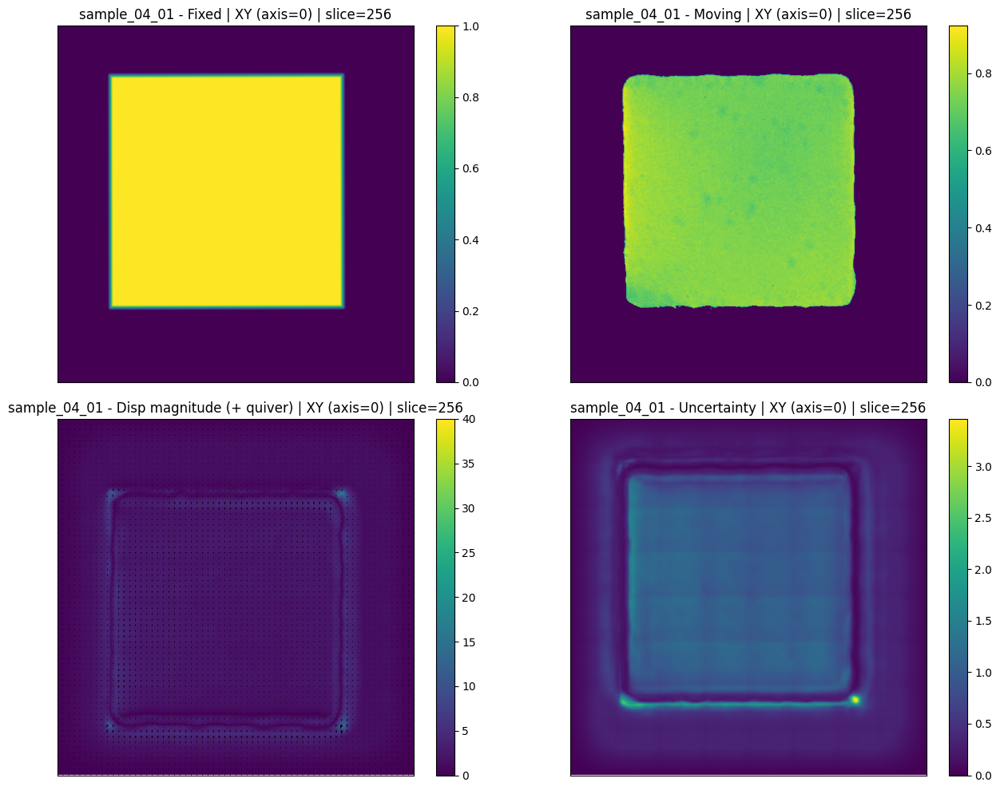

(<Figure size 1400x1000 with 8 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY (axis=0) | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY (axis=0) | slice=256'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude (+ quiver) | XY (axis=0) | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty | XY (axis=0) | slice=256'}>]],
       dtype=object))

In [ ]:
# Example: show one XY slice (axis=0) through the middle
plot_slice_fixed_moving_disp_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    axis=0,
    slice_idx=None,               # middle
    rotate_k=0,                   # set to -1 or 1 if you want a rotation
    quiver_subsample=8,
    disp_vmax=40,
    unc_vmax=None,
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_slice_fixed_moving_moved_disp_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    axis: int = 0,          # 0=z (XY), 1=y (XZ), 2=x (YZ)
    slice_idx: int | None = None,
    rotate_k: int = 0,
    use_quiver: bool = True,
    quiver_subsample: int = 6,
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    title_prefix: str = "",
):
    """
    Plots ONE slice of:
        [Fixed | Moving | Moved]
        [Displacement magnitude + quiver | Uncertainty]

    Expected shapes:
        fixed, moving, moved: (D,H,W)
        disp_field: (D,H,W,3)
        uncertainty: (D,H,W)
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if slice_idx is None:
        slice_idx = fixed_image.shape[axis] // 2

    def _take_slice(vol3d, ax, idx):
        if ax == 0:
            return vol3d[idx, :, :]
        elif ax == 1:
            return vol3d[:, idx, :]
        else:
            return vol3d[:, :, idx]

    def _take_slice_disp(disp4d, ax, idx):
        if ax == 0:
            return disp4d[idx, :, :, :]
        elif ax == 1:
            return disp4d[:, idx, :, :]
        else:
            return disp4d[:, :, idx, :]

    fixed_sl = _take_slice(fixed_image, axis, slice_idx)
    moving_sl = _take_slice(moving_image, axis, slice_idx)
    moved_sl = _take_slice(moved_image, axis, slice_idx)
    unc_sl = _take_slice(uncertainty, axis, slice_idx)
    disp_sl = _take_slice_disp(disp_field, axis, slice_idx)

    if rotate_k != 0:
        fixed_sl = np.rot90(fixed_sl, k=rotate_k)
        moving_sl = np.rot90(moving_sl, k=rotate_k)
        moved_sl = np.rot90(moved_sl, k=rotate_k)
        unc_sl = np.rot90(unc_sl, k=rotate_k)
        disp_sl = np.rot90(disp_sl, k=rotate_k, axes=(0, 1))

    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plane_name = {0: "XY", 1: "XZ", 2: "YZ"}[axis]
    pfx = (title_prefix + " - ") if title_prefix else ""

    # ----- TOP ROW -----
    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_name} | slice={slice_idx}")

    # ----- BOTTOM LEFT: DISPLACEMENT -----
    axd = axes[1, 0]
    imd = axd.imshow(disp_mag, vmin=0, vmax=disp_vmax)
    axd.set_title(f"{pfx}Disp magnitude (+ quiver)")
    axd.set_xticks([])
    axd.set_yticks([])
    plt.colorbar(imd, ax=axd, fraction=0.046, pad=0.04)

    if use_quiver:
        H, W = disp_mag.shape
        X, Y = np.meshgrid(np.arange(W), np.arange(H))

        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]  # flip Y to match Cartesian view

        ss = max(int(quiver_subsample), 1)

        axd.quiver(
            X[::ss, ::ss],
            Y[::ss, ::ss],
            U[::ss, ::ss],
            V[::ss, ::ss],
            angles="xy",
            scale_units="xy",
            scale=1,
            width=0.0025,
        )
        axd.invert_yaxis()

    # ----- BOTTOM MIDDLE: UNCERTAINTY -----
    _imshow(
        axes[1, 1],
        unc_sl,
        f"{pfx}Uncertainty",
        vmin=0,
        vmax=unc_vmax,
    )

    # bottom-right empty (for clean layout symmetry)
    axes[1, 2].axis("off")

    plt.tight_layout()
    plt.show()

    return fig, axes


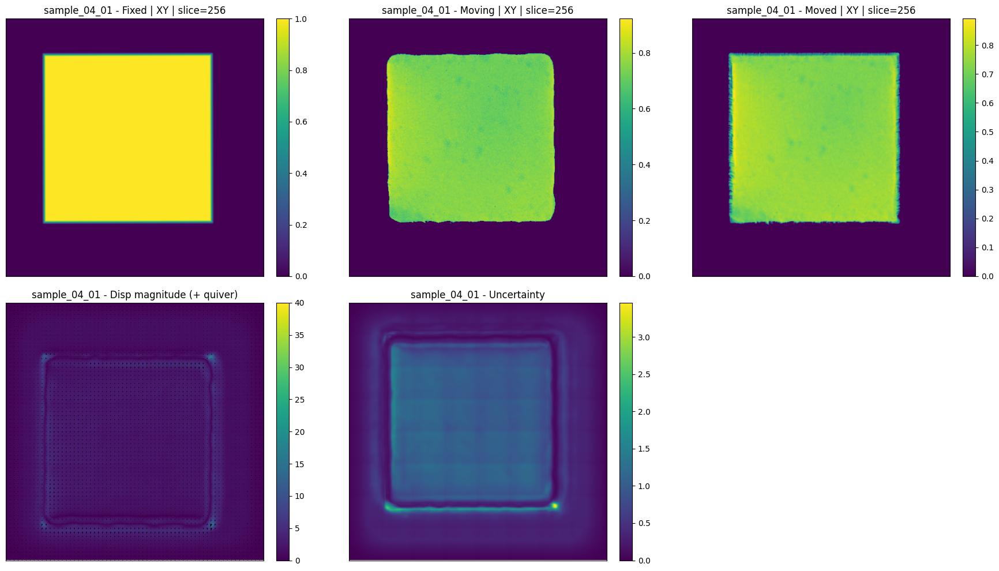

(<Figure size 1800x1000 with 11 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY | slice=256'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude (+ quiver)'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>, <Axes: >]],
       dtype=object))

In [ ]:
plot_slice_fixed_moving_moved_disp_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    axis=0,
    slice_idx=None,
    rotate_k=0,
    quiver_subsample=8,
    disp_vmax=40,
    unc_vmax=None,
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_slice_fixed_moving_moved_disp_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    axis: int = 0,          # 0=z (XY), 1=y (XZ), 2=x (YZ)
    slice_idx: int | None = None,
    rotate_k: int = 0,
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    title_prefix: str = "",
):
    """
    Plots ONE slice of:
        [Fixed | Moving | Moved]
        [Displacement magnitude | Uncertainty]

    Expected shapes:
        fixed, moving, moved: (D,H,W)
        disp_field: (D,H,W,3)
        uncertainty: (D,H,W)
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if slice_idx is None:
        slice_idx = fixed_image.shape[axis] // 2

    def _take_slice(vol3d, ax, idx):
        if ax == 0:
            return vol3d[idx, :, :]
        elif ax == 1:
            return vol3d[:, idx, :]
        else:
            return vol3d[:, :, idx]

    def _take_slice_disp(disp4d, ax, idx):
        if ax == 0:
            return disp4d[idx, :, :, :]
        elif ax == 1:
            return disp4d[:, idx, :, :]
        else:
            return disp4d[:, :, idx, :]

    fixed_sl = _take_slice(fixed_image, axis, slice_idx)
    moving_sl = _take_slice(moving_image, axis, slice_idx)
    moved_sl = _take_slice(moved_image, axis, slice_idx)
    unc_sl = _take_slice(uncertainty, axis, slice_idx)
    disp_sl = _take_slice_disp(disp_field, axis, slice_idx)

    if rotate_k != 0:
        fixed_sl = np.rot90(fixed_sl, k=rotate_k)
        moving_sl = np.rot90(moving_sl, k=rotate_k)
        moved_sl = np.rot90(moved_sl, k=rotate_k)
        unc_sl = np.rot90(unc_sl, k=rotate_k)
        disp_sl = np.rot90(disp_sl, k=rotate_k, axes=(0, 1))

    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plane_name = {0: "XY", 1: "XZ", 2: "YZ"}[axis]
    pfx = (title_prefix + " - ") if title_prefix else ""

    # ---- TOP ROW ----
    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_name} | slice={slice_idx}")

    # ---- BOTTOM ROW ----
    _imshow(axes[1, 0], disp_mag,
            f"{pfx}Displacement Magnitude",
            vmin=0,
            vmax=disp_vmax)

    _imshow(axes[1, 1], unc_sl,
            f"{pfx}Uncertainty",
            vmin=0,
            vmax=unc_vmax)

    axes[1, 2].axis("off")  # keep layout clean

    plt.tight_layout()
    plt.show()

    return fig, axes


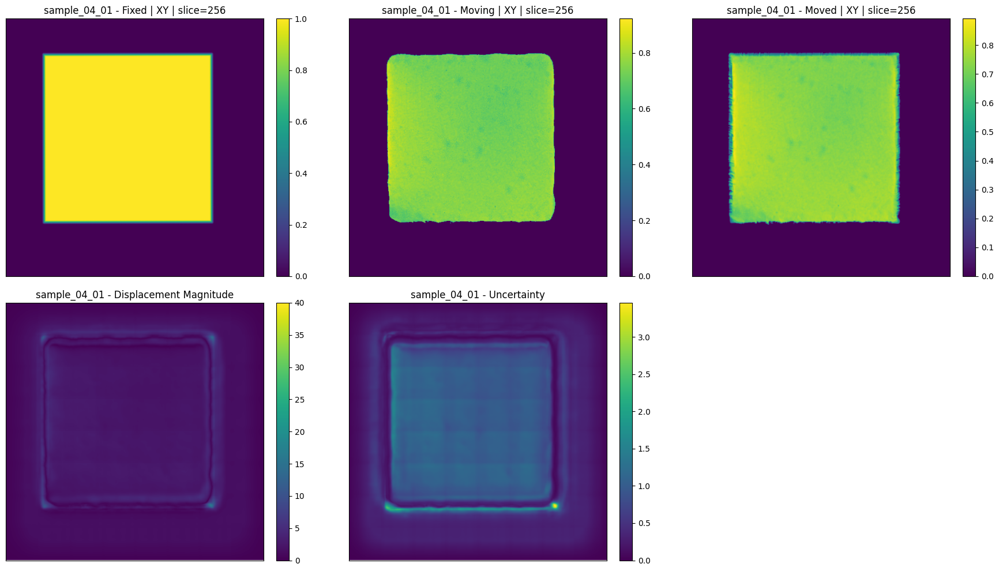

(<Figure size 1800x1000 with 11 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY | slice=256'}>],
        [<Axes: title={'center': 'sample_04_01 - Displacement Magnitude'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>, <Axes: >]],
       dtype=object))

In [ ]:
plot_slice_fixed_moving_moved_disp_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    axis=0,                       # XY slice
    slice_idx=None,               # middle
    rotate_k=0,
    disp_vmax=40,
    unc_vmax=None,
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_slice_fixed_moving_moved_disp_mag_dir_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    axis: int = 0,               # 0=z (XY), 1=y (XZ), 2=x (YZ)
    slice_idx: int | None = None,
    rotate_k: int = 0,
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    mag_mask_thresh: float = 0.0,  # mask direction where magnitude <= thresh
    title_prefix: str = "",
):
    """
    Shows one slice of:
      Top row:   Fixed | Moving | Moved
      Bottom row: Disp magnitude | Disp direction (angle) | Uncertainty

    Direction plot:
      - angle in degrees in the slice plane, computed via atan2(v, u)
      - range [-180, 180]
      - masked where magnitude <= mag_mask_thresh (optional)
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed, moving, moved must have the same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    if axis not in (0, 1, 2):
        raise ValueError("axis must be 0, 1, or 2.")

    if slice_idx is None:
        slice_idx = fixed_image.shape[axis] // 2

    def _take_slice(vol3d, ax, idx):
        if ax == 0:
            return vol3d[idx, :, :]
        elif ax == 1:
            return vol3d[:, idx, :]
        else:
            return vol3d[:, :, idx]

    def _take_slice_disp(disp4d, ax, idx):
        if ax == 0:
            return disp4d[idx, :, :, :]     # (H,W,3)
        elif ax == 1:
            return disp4d[:, idx, :, :]     # (D,W,3)
        else:
            return disp4d[:, :, idx, :]     # (D,H,3)

    fixed_sl = _take_slice(fixed_image, axis, slice_idx)
    moving_sl = _take_slice(moving_image, axis, slice_idx)
    moved_sl = _take_slice(moved_image, axis, slice_idx)
    unc_sl = _take_slice(uncertainty, axis, slice_idx)
    disp_sl = _take_slice_disp(disp_field, axis, slice_idx)

    # Rotate if requested (for viewing only)
    if rotate_k != 0:
        fixed_sl = np.rot90(fixed_sl, k=rotate_k)
        moving_sl = np.rot90(moving_sl, k=rotate_k)
        moved_sl = np.rot90(moved_sl, k=rotate_k)
        unc_sl = np.rot90(unc_sl, k=rotate_k)
        disp_sl = np.rot90(disp_sl, k=rotate_k, axes=(0, 1))

    # Magnitude
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # --- Direction in the slice plane ---
    # Decide which two components are "in-plane" depending on the slice:
    # axis=0 shows (H,W) which corresponds to (y,x) in index space -> in-plane components: dx, dy
    # axis=1 shows (D,W) -> in-plane components: dx, dz
    # axis=2 shows (D,H) -> in-plane components: dy, dz
    if axis == 0:
        u = disp_sl[..., 0]  # dx
        v = disp_sl[..., 1]  # dy
        dir_label = "Direction angle (dx,dy)"
    elif axis == 1:
        u = disp_sl[..., 0]  # dx
        v = disp_sl[..., 2]  # dz
        dir_label = "Direction angle (dx,dz)"
    else:
        u = disp_sl[..., 1]  # dy
        v = disp_sl[..., 2]  # dz
        dir_label = "Direction angle (dy,dz)"

    # angle in degrees [-180, 180]
    disp_dir_deg = np.degrees(np.arctan2(v, u))

    # Mask direction where magnitude is too small (direction unstable there)
    if mag_mask_thresh is not None and mag_mask_thresh > 0:
        disp_dir_deg = np.ma.array(disp_dir_deg, mask=(disp_mag <= mag_mask_thresh))

    # ---- Plot ----
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plane_name = {0: "XY", 1: "XZ", 2: "YZ"}[axis]
    pfx = (title_prefix + " - ") if title_prefix else ""

    # top row
    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_name} | slice={slice_idx}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_name} | slice={slice_idx}")

    # bottom row
    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax)

    # direction: use a cyclic colormap (twilight is good for angles)
    _imshow(axes[1, 1], disp_dir_deg, f"{pfx}{dir_label} [deg]",
            vmin=-180, vmax=180, cmap="twilight")

    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax)

    plt.tight_layout()
    plt.show()
    return fig, axes


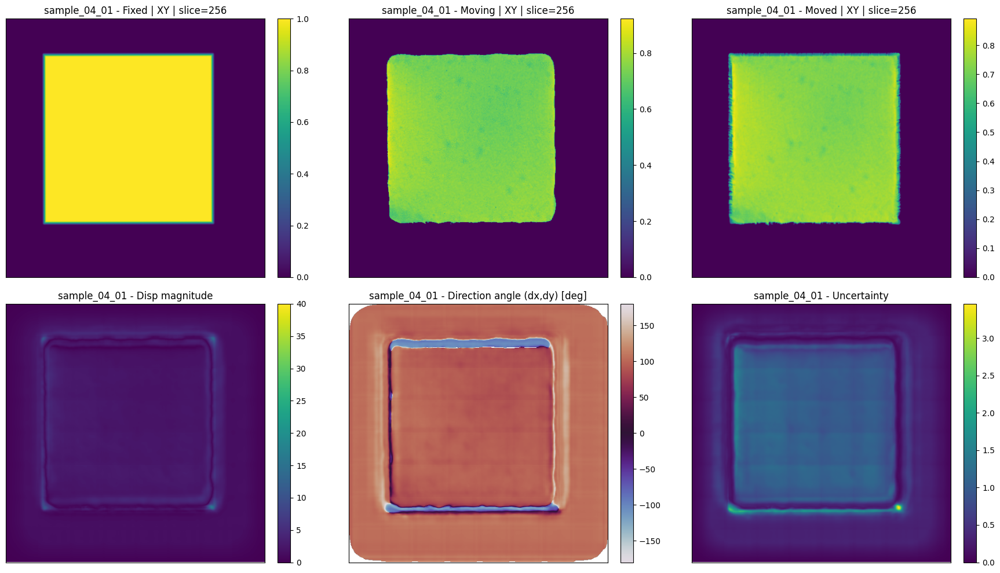

(<Figure size 1800x1000 with 12 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY | slice=256'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY | slice=256'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude'}>,
         <Axes: title={'center': 'sample_04_01 - Direction angle (dx,dy) [deg]'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>]],
       dtype=object))

In [ ]:
plot_slice_fixed_moving_moved_disp_mag_dir_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    axis=0,
    slice_idx=None,
    rotate_k=0,
    disp_vmax=40,
    unc_vmax=None,
    mag_mask_thresh=0.2,          # masks direction where mag <= 0.2 vox
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_plane_fixed_moving_moved_mag_dir_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    mag_mask_thresh: float = 0.0,      # mask direction where magnitude <= thresh
    title_prefix: str = "",
):
    """
    Plane conventions match your reference script:
      - YZ:  vol[x_mid, :, :]                (no rotation)
      - XZ:  rot90(vol[:, :, z_mid], k=-1)   (clockwise)
      - XY:  vol[:, y_mid, :]                (no rotation)

    Direction map matches your quiver convention:
      U = dx
      V = -dy     (invert only the y-component)
      angle = atan2(V, U) in degrees  [-180, 180]
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # ---- extract slices using YOUR conventions ----
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]          # (Dy,Dz,3)
        plane_title = f"YZ (X={si})"

        # displayed axes correspond to (Y,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)    # (Dx,Dy?,3) after rotation -> (Dx,Dy?) same as images
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

        # displayed axes correspond to (X,Y) after rotation
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]          # (Dx,Dz,3)
        plane_title = f"XY (Y={si})"

        # displayed axes correspond to (X,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    # ---- displacement magnitude ----
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # ---- direction angle map (what quiver would show) ----
    disp_dir_deg = np.degrees(np.arctan2(V, U))   # [-180, 180]

    # Mask unstable direction where magnitude is tiny
    if mag_mask_thresh is not None and mag_mask_thresh > 0:
        disp_dir_deg = np.ma.array(disp_dir_deg, mask=(disp_mag <= mag_mask_thresh))

    # ---- plot ----
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    pfx = (title_prefix + " - ") if title_prefix else ""

    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_title}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_title}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_title}")

    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax, cmap="viridis")
    _imshow(axes[1, 1], disp_dir_deg, f"{pfx}Disp direction (deg)", vmin=-180, vmax=180, cmap="twilight")
    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax, cmap="viridis")

    plt.tight_layout()
    plt.show()
    return fig, axes


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_plane_fixed_moving_moved_mag_dir_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    mag_mask_thresh: float = 0.0,      # mask direction where magnitude <= thresh
    title_prefix: str = "",
):
    """
    Plane conventions match your reference script:
      - YZ:  vol[x_mid, :, :]                (no rotation)
      - XZ:  rot90(vol[:, :, z_mid], k=-1)   (clockwise)
      - XY:  vol[:, y_mid, :]                (no rotation)

    Direction map matches your quiver convention:
      U = dx
      V = -dy     (invert only the y-component)
      angle = atan2(V, U) in degrees  [-180, 180]
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # ---- extract slices using YOUR conventions ----
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]          # (Dy,Dz,3)
        plane_title = f"YZ (X={si})"

        # displayed axes correspond to (Y,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)    # (Dx,Dy?,3) after rotation -> (Dx,Dy?) same as images
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

        # displayed axes correspond to (X,Y) after rotation
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]          # (Dx,Dz,3)
        plane_title = f"XY (Y={si})"

        # displayed axes correspond to (X,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    # ---- displacement magnitude ----
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # ---- direction angle map (what quiver would show) ----
    disp_dir_deg = np.degrees(np.arctan2(V, U))   # [-180, 180]

    # Mask unstable direction where magnitude is tiny
    if mag_mask_thresh is not None and mag_mask_thresh > 0:
        disp_dir_deg = np.ma.array(disp_dir_deg, mask=(disp_mag <= mag_mask_thresh))

    # ---- plot ----
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    pfx = (title_prefix + " - ") if title_prefix else ""

    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_title}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_title}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_title}")

    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax, cmap="viridis")
    _imshow(axes[1, 1], disp_dir_deg, f"{pfx}Disp direction (deg)", vmin=-180, vmax=180, cmap="twilight")
    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax, cmap="viridis")

    plt.tight_layout()
    plt.show()
    return fig, axes


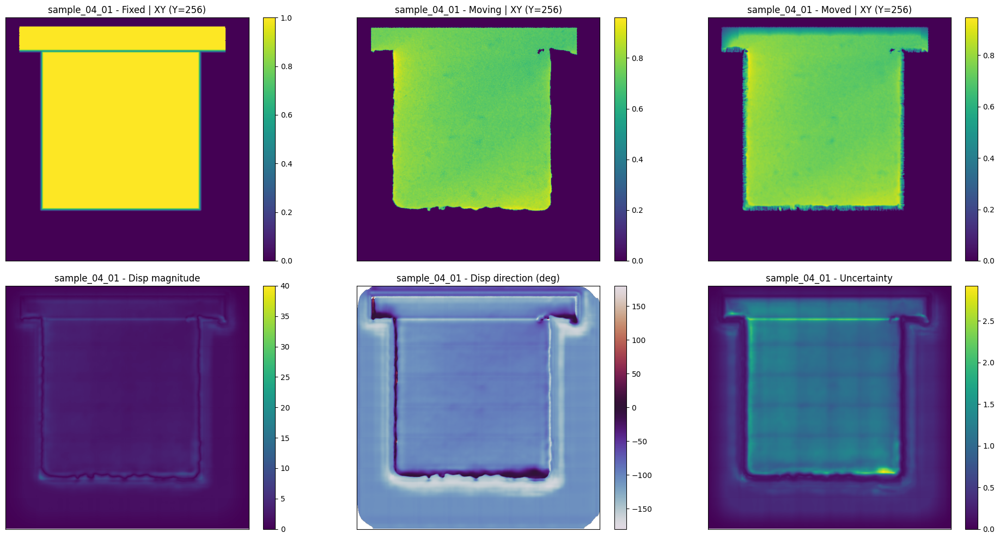

(<Figure size 2000x1000 with 12 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY (Y=256)'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude'}>,
         <Axes: title={'center': 'sample_04_01 - Disp direction (deg)'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>]],
       dtype=object))

In [ ]:
plot_plane_fixed_moving_moved_mag_dir_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    plane="XY",                   # "YZ" / "XZ" / "XY"
    slice_index=None,
    disp_vmax=40,
    unc_vmax=None,
    mag_mask_thresh=0.2,          # masks noisy direction where magnitude ~0
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_plane_fixed_moving_moved_mag_dir_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    disp_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    mag_mask_thresh: float = 0.0,      # mask direction where magnitude <= thresh
    title_prefix: str = "",
):
    """
    Plane conventions match your reference script:
      - YZ:  vol[x_mid, :, :]                (no rotation)
      - XZ:  rot90(vol[:, :, z_mid], k=-1)   (clockwise)
      - XY:  vol[:, y_mid, :]                (no rotation)

    Direction map matches your quiver convention:
      U = dx
      V = -dy     (invert only the y-component)
      angle = atan2(V, U) in degrees  [-180, 180]
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # ---- extract slices using YOUR conventions ----
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]          # (Dy,Dz,3)
        plane_title = f"YZ (X={si})"

        # displayed axes correspond to (Y,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)    # (Dx,Dy?,3) after rotation -> (Dx,Dy?) same as images
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

        # displayed axes correspond to (X,Y) after rotation
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]          # (Dx,Dz,3)
        plane_title = f"XY (Y={si})"

        # displayed axes correspond to (X,Z)
        # Use U=dx, V=-dy for direction (your convention)
        U = disp_sl[..., 0]
        V = -disp_sl[..., 1]

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    # ---- displacement magnitude ----
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # ---- direction angle map (what quiver would show) ----
    disp_dir_deg = np.degrees(np.arctan2(V, U))   # [-180, 180]

    # Mask unstable direction where magnitude is tiny
    if mag_mask_thresh is not None and mag_mask_thresh > 0:
        disp_dir_deg = np.ma.array(disp_dir_deg, mask=(disp_mag <= mag_mask_thresh))

    # ---- plot ----
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    pfx = (title_prefix + " - ") if title_prefix else ""

    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_title}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_title}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_title}")

    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax, cmap="viridis")
    _imshow(axes[1, 1], disp_dir_deg, f"{pfx}Disp direction (deg)", vmin=-180, vmax=180, cmap="twilight")
    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax, cmap="viridis")

    plt.tight_layout()
    plt.show()
    return fig, axes


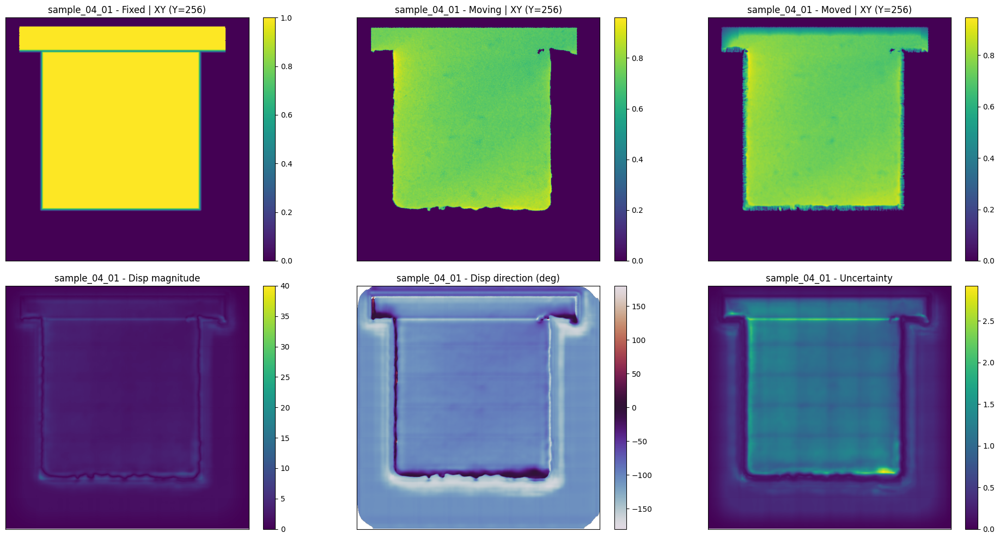

(<Figure size 2000x1000 with 12 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY (Y=256)'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude'}>,
         <Axes: title={'center': 'sample_04_01 - Disp direction (deg)'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>]],
       dtype=object))

In [ ]:
plot_plane_fixed_moving_moved_mag_dir_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    plane="XY",                   # "YZ" / "XZ" / "XY"
    slice_index=None,
    disp_vmax=40,
    unc_vmax=None,
    mag_mask_thresh=0.2,          # masks noisy direction where magnitude ~0
    title_prefix=sample_name
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_plane_fixed_moving_moved_mag_quiver_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    quiver_subsample: int = 6,
    quiver_scale: float = 1.0,         # scale=1 means arrow length = displacement in pixels
    disp_vmax: float | None = 40.0,    # magnitude colormap max (pixels)
    unc_vmax: float | None = None,
    title_prefix: str = "",
    mask_background_with: np.ndarray | None = None,  # e.g., moving_image or fixed_image; mask where ==0
):
    """
    Plane conventions match your reference script:
      - YZ:  vol[x_mid, :, :]                (no rotation)
      - XZ:  rot90(vol[:, :, z_mid], k=-1)   (clockwise)
      - XY:  vol[:, y_mid, :]                (no rotation)

    Quiver direction matches your convention:
      U = dx
      V = -dy   (invert only y-component)
    Quiver colored by displacement magnitude.
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # ---- extract slices using YOUR conventions ----
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]          # (Dy,Dz,3)
        plane_title = f"YZ (X={si})"

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)    # rotate vectors same way
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]          # (Dx,Dz,3)
        plane_title = f"XY (Y={si})"

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    # ---- magnitude ----
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # ---- quiver components (your convention) ----
    U = disp_sl[..., 0]       # dx
    V = -disp_sl[..., 1]      # invert only y-comp (matches your code)

    # ---- optional mask (hide arrows in air/background) ----
    mask = None
    if mask_background_with is not None:
        m = np.asarray(mask_background_with)
        if m.shape != fixed_image.shape:
            raise ValueError("mask_background_with must be same shape as volumes.")
        # build the same slice
        if plane == "YZ":
            mask = (m[si, :, :] != 0)
        elif plane == "XZ":
            mask = np.rot90(m[:, :, si], k=-1) != 0
        else:  # XY
            mask = (m[:, si, :] != 0)

    # ---- plot ----
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    pfx = (title_prefix + " - ") if title_prefix else ""

    # Top row
    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_title}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_title}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_title}")

    # Bottom-left: magnitude heatmap
    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax, cmap="viridis")

    # Bottom-middle: direction via quiver (colored by magnitude)
    axq = axes[1, 1]
    axq.set_title(f"{pfx}Disp direction (quiver) | {plane_title}")
    axq.set_xticks([])
    axq.set_yticks([])
    axq.set_aspect("equal")

    H, W = disp_mag.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))

    ss = max(int(quiver_subsample), 1)
    Xs = X[::ss, ::ss]
    Ys = Y[::ss, ::ss]
    Us = U[::ss, ::ss]
    Vs = V[::ss, ::ss]
    Ms = disp_mag[::ss, ::ss]

    if mask is not None:
        mask_s = mask[::ss, ::ss]
        Us = np.where(mask_s, Us, np.nan)
        Vs = np.where(mask_s, Vs, np.nan)
        Ms = np.where(mask_s, Ms, np.nan)

    quiv = axq.quiver(
        Xs, Ys, Us, Vs, Ms,
        angles="xy",
        scale_units="xy",
        scale=(1.0 / quiver_scale) if quiver_scale != 0 else 1.0,  # keep intuitive control
        cmap="viridis",
        norm=plt.Normalize(vmin=0, vmax=disp_vmax if disp_vmax is not None else np.nanmax(Ms)),
        width=0.003,
    )
    axq.invert_yaxis()  # same as your reference
    cbar = plt.colorbar(quiv, ax=axq, fraction=0.046, pad=0.04)
    cbar.set_label("Disp magnitude (for arrow color)")

    # Bottom-right: uncertainty
    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax, cmap="viridis")

    plt.tight_layout()
    plt.show()
    return fig, axes


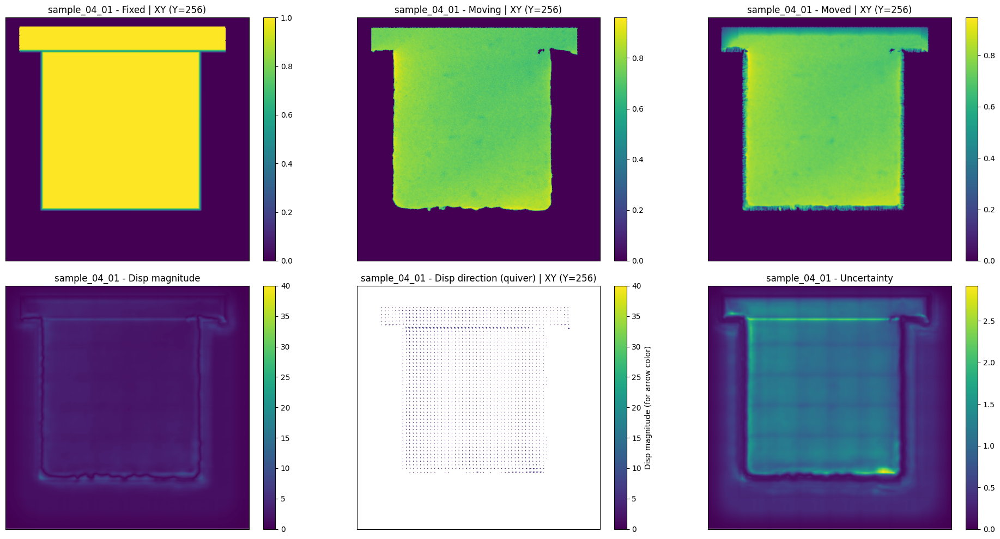

(<Figure size 2000x1000 with 12 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moving | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Moved | XY (Y=256)'}>],
        [<Axes: title={'center': 'sample_04_01 - Disp magnitude'}>,
         <Axes: title={'center': 'sample_04_01 - Disp direction (quiver) | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty'}>]],
       dtype=object))

In [ ]:
plot_plane_fixed_moving_moved_mag_quiver_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,      # or moved_std
    plane="XY",                      # "YZ" / "XZ" / "XY"
    slice_index=None,
    quiver_subsample=8,
    quiver_scale=1.0,
    disp_vmax=40,
    unc_vmax=None,
    mask_background_with=moving_image,  # hides arrows in air (optional but useful)
    title_prefix=sample_name
)


In [ ]:
OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
os.makedirs(OUT_DIR, exist_ok=True)


In [ ]:
OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}")
os.makedirs(OUT_DIR, exist_ok=True)


In [ ]:
f"{sample_name}"

'sample_04_01'

In [ ]:
OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}")
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_overlay_fixed_moving_moved_mag_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same slicing style as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    cmap_fixed: str = "Greens",
    cmap_other: str = "gray",
    overlay_alpha: float = 0.5,
    mag_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    title_prefix: str = "",
):
    """
    Plots a 2x2 figure for ONE slice (plane-based), matching your conventions:
      - (0,0): Overlay fixed vs moving
      - (0,1): Overlay fixed vs moved
      - (1,0): Displacement magnitude
      - (1,1): Uncertainty map

    Plane conventions (same as your reference code):
      - YZ: vol[x_mid, :, :]
      - XZ: np.rot90(vol[:, :, z_mid], k=-1)
      - XY: vol[:, y_mid, :]
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have the same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # --- slice extraction (your style) ---
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]
        plane_title = f"YZ (X={si})"

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]
        plane_title = f"XY (Y={si})"

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # --- plotting helpers ---
    def plot_overlay(ax, fixed2d, other2d, title):
        ax.imshow(other2d, cmap=cmap_other)
        ax.imshow(fixed2d, cmap=cmap_fixed, alpha=overlay_alpha)
        ax.set_title(title)
        ax.axis("off")
        ax.set_aspect("equal")

    def imshow_with_cbar(ax, img, title, vmin=None, vmax=None, cmap="viridis", cbar_label=None):
        im = ax.imshow(img, cmap=cmap, vmin=vmin, vmax=vmax, origin="upper")
        ax.set_title(title)
        ax.axis("off")
        ax.set_aspect("equal")
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        if cbar_label:
            cbar.set_label(cbar_label)

    pfx = (title_prefix + " - ") if title_prefix else ""

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    plot_overlay(
        axes[0, 0],
        fixed_sl,
        moving_sl,
        f"{pfx}Fixed vs Moving Overlay | {plane_title}",
    )

    plot_overlay(
        axes[0, 1],
        fixed_sl,
        moved_sl,
        f"{pfx}Fixed vs Moved Overlay | {plane_title}",
    )

    imshow_with_cbar(
        axes[1, 0],
        disp_mag,
        f"{pfx}Displacement Magnitude | {plane_title}",
        vmin=0,
        vmax=mag_vmax,
        cmap="viridis",
        cbar_label="Disp. magnitude (px)",
    )

    imshow_with_cbar(
        axes[1, 1],
        unc_sl,
        f"{pfx}Uncertainty Map | {plane_title}",
        vmin=0,
        vmax=unc_vmax,
        cmap="viridis",
        cbar_label="Uncertainty",
    )

    plt.tight_layout()
    plt.show()
    return fig, axes


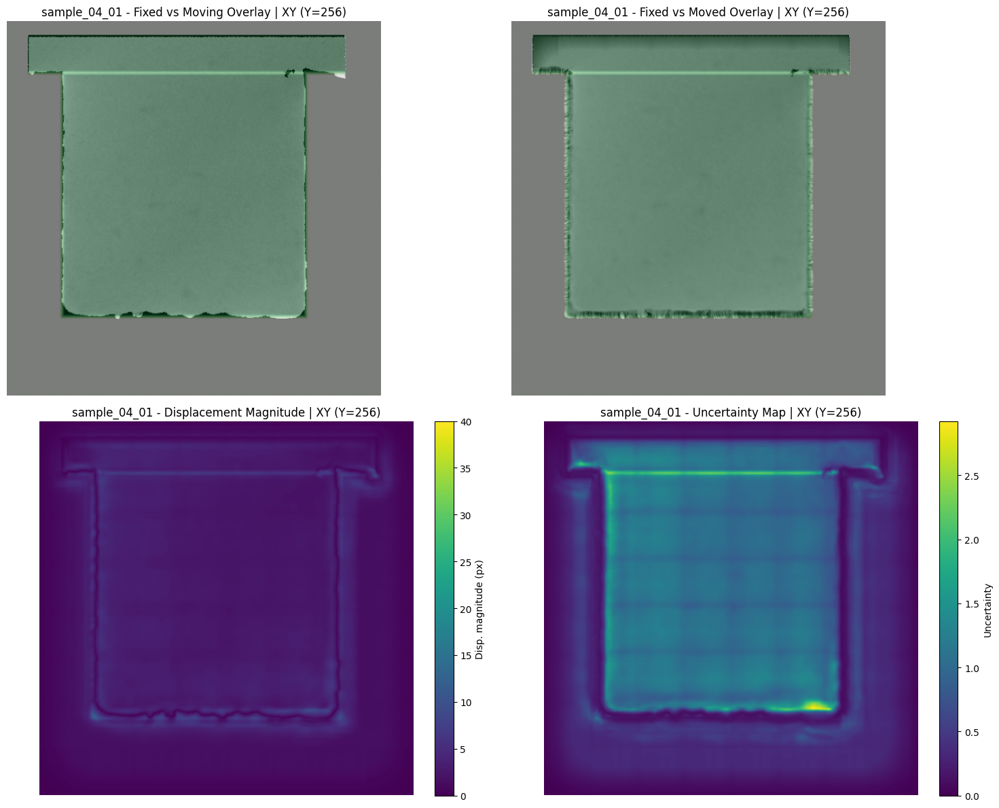

(<Figure size 1600x1200 with 6 Axes>,
 array([[<Axes: title={'center': 'sample_04_01 - Fixed vs Moving Overlay | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Fixed vs Moved Overlay | XY (Y=256)'}>],
        [<Axes: title={'center': 'sample_04_01 - Displacement Magnitude | XY (Y=256)'}>,
         <Axes: title={'center': 'sample_04_01 - Uncertainty Map | XY (Y=256)'}>]],
       dtype=object))

In [ ]:
plot_overlay_fixed_moving_moved_mag_unc(
    fixed_image=fixed_image,
    moving_image=moving_image,
    moved_image=moved_mean,
    disp_field=disp_mean,
    uncertainty=disp_std_mag_B,   # or moved_std
    plane="XY",
    slice_index=None,
    mag_vmax=40,
    unc_vmax=None,
    title_prefix=sample_name
)


In [ ]:
import os
import re
import h5py
import numpy as np


def load_all_pairs_pad_and_save_h5(
    in_h5_path: str,
    out_h5_path: str,
    *,
    pad: int = 30,                 # pad on BOTH ends
    pad_value: float = 0.0,
    compression: str | None = "gzip",
    compression_opts: int = 4,
    overwrite: bool = False,
    verbose: bool = True,
):
    """
    Read all (static_i, moving_i) datasets from in_h5_path, pad BOTH ends by `pad`
    in (Z,Y,X), and save to out_h5_path as (static_i, moving_i) with attrs preserved.

    Your H5 format (from save_to_hdf5) is assumed:
      - datasets: static_0, moving_0, static_1, moving_1, ...
      - each dataset is 3D (Z,Y,X)
      - static_i has attrs like sample_name (and moving_i may also)
    """

    if not os.path.exists(in_h5_path):
        raise FileNotFoundError(f"Input H5 not found: {in_h5_path}")

    if os.path.exists(out_h5_path):
        if not overwrite:
            raise FileExistsError(f"Output H5 exists: {out_h5_path} (set overwrite=True)")
        os.remove(out_h5_path)

    pad_width = ((pad, pad), (pad, pad), (pad, pad))
    idx_re = re.compile(r"^(static|moving)_(\d+)$")

    def _copy_attrs(src_obj, dst_obj):
        for k, v in src_obj.attrs.items():
            dst_obj.attrs[k] = v

    # choose dataset create kwargs
    ds_kwargs = {}
    if compression is not None:
        ds_kwargs["compression"] = compression
        if compression == "gzip":
            ds_kwargs["compression_opts"] = compression_opts

    with h5py.File(in_h5_path, "r") as hin:
        # collect indices that have both static_i and moving_i
        indices = set()
        for k in hin.keys():
            m = idx_re.match(k)
            if m:
                indices.add(int(m.group(2)))
        indices = sorted(indices)

        pair_indices = [i for i in indices if (f"static_{i}" in hin and f"moving_{i}" in hin)]
        if not pair_indices:
            raise RuntimeError(f"No static_i/moving_i pairs found in {in_h5_path}")

        if verbose:
            print(f"Found {len(pair_indices)} pair(s): {pair_indices}")
            print(f"Padding BOTH ends by {pad} in (Z,Y,X)")
            print(f"Writing: {out_h5_path}")

        with h5py.File(out_h5_path, "w") as hout:
            # copy file-level attrs (if any)
            _copy_attrs(hin, hout)

            for i in pair_indices:
                s_key = f"static_{i}"
                m_key = f"moving_{i}"

                static = hin[s_key][...]
                moving = hin[m_key][...]

                if static.ndim != 3 or moving.ndim != 3:
                    raise ValueError(f"{s_key} or {m_key} not 3D: {static.shape}, {moving.shape}")

                # keep dtype, but float32 is usually best for your pipeline
                if np.issubdtype(static.dtype, np.number):
                    static = static.astype(np.float32, copy=False)
                if np.issubdtype(moving.dtype, np.number):
                    moving = moving.astype(np.float32, copy=False)

                static_p = np.pad(static, pad_width, mode="constant", constant_values=pad_value)
                moving_p = np.pad(moving, pad_width, mode="constant", constant_values=pad_value)

                ds_s = hout.create_dataset(s_key, data=static_p, **ds_kwargs)
                ds_m = hout.create_dataset(m_key, data=moving_p, **ds_kwargs)

                # copy dataset attrs (sample_name etc.)
                _copy_attrs(hin[s_key], ds_s)
                _copy_attrs(hin[m_key], ds_m)

                if verbose:
                    name = hin[s_key].attrs.get("sample_name", f"sample_{i}")
                    print(f"[{i:02d}] {name}: {static.shape}->{static_p.shape}")

    if verbose:
        print("✅ Done.")


In [ ]:
load_all_pairs_pad_and_save_h5(
    in_h5_path="/home/kchand/input_data/test_BTU_samples_simple_structures.h5",
    out_h5_path="/home/kchand/input_data/test_BTU_samples_simple_structures_pad50_bothends.h5",
    pad=50,
    overwrite=True,
)


Found 4 pair(s): [0, 1, 2, 3]
Padding BOTH ends by 50 in (Z,Y,X)
Writing: /home/kchand/input_data/test_BTU_samples_simple_structures_pad50_bothends.h5
[00] sample_04_01: (512, 512, 512)->(612, 612, 612)
[01] sample_04_02: (512, 1024, 512)->(612, 1124, 612)
[02] sample_04_03: (512, 640, 512)->(612, 740, 612)
[03] sample_04_04: (512, 512, 512)->(612, 612, 612)
✅ Done.


2026-02-16 14:07:36.562850: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-16 14:07:36.600825: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-02-16 14:07:36.600853: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-02-16 14:07:36.602128: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-02-16 14:07:36.610503: I tensorflow/core/platform/cpu_feature_guar

Found 4 test pair(s) in: /home/kchand/input_data/test_BTU_samples_simple_structures_pad50_bothends.h5


2026-02-16 14:07:39.334095: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2026-02-16 14:07:39.334147: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: sv1225
2026-02-16 14:07:39.334154: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: sv1225
2026-02-16 14:07:39.334348: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: 590.48.1
2026-02-16 14:07:39.334395: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  590.48.01  Release Build  (dvs-builder@U22-I3-AE18-23-3)  Mon Dec  8 13:05:00 UTC 2025
GCC version:  gcc version 13.3.0 (Ubuntu 13.3.0-6ubuntu2~24.0

Loaded ensemble member 00: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_00/weights_stage2.h5
Loaded ensemble member 01: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_01/weights_stage2.h5
Loaded ensemble member 02: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_02/weights_stage2.h5
Loaded ensemble member 03: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_03/weights_stage2.h5
Loaded ensemble member 04: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_04/weights_stage2.h5
Loaded ensemble member 05: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_05/weights_stage2.h5
Loaded ensemble member 06: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_06/weights_stage2.h5
Loaded ensemble member 07: /home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna/ens_07/weights_stage2.h5


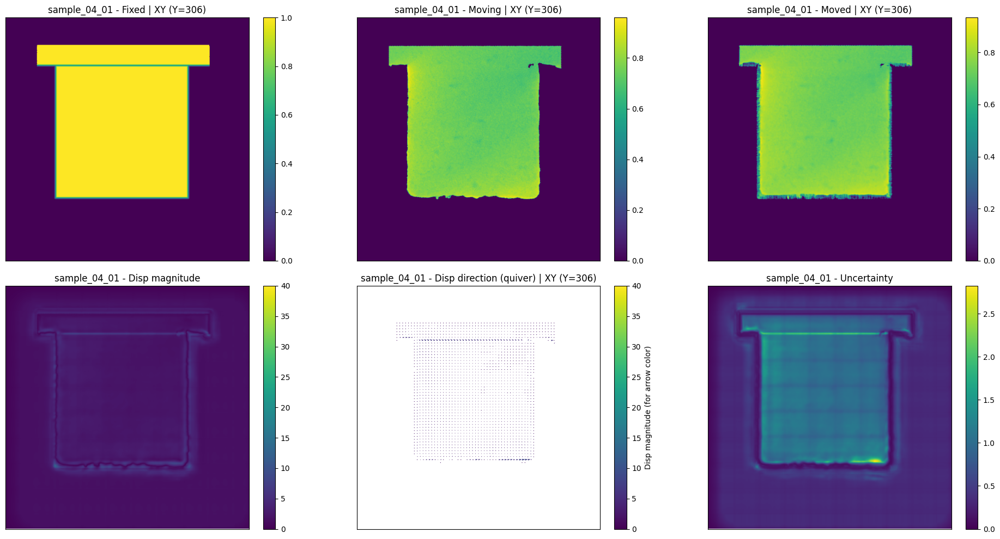

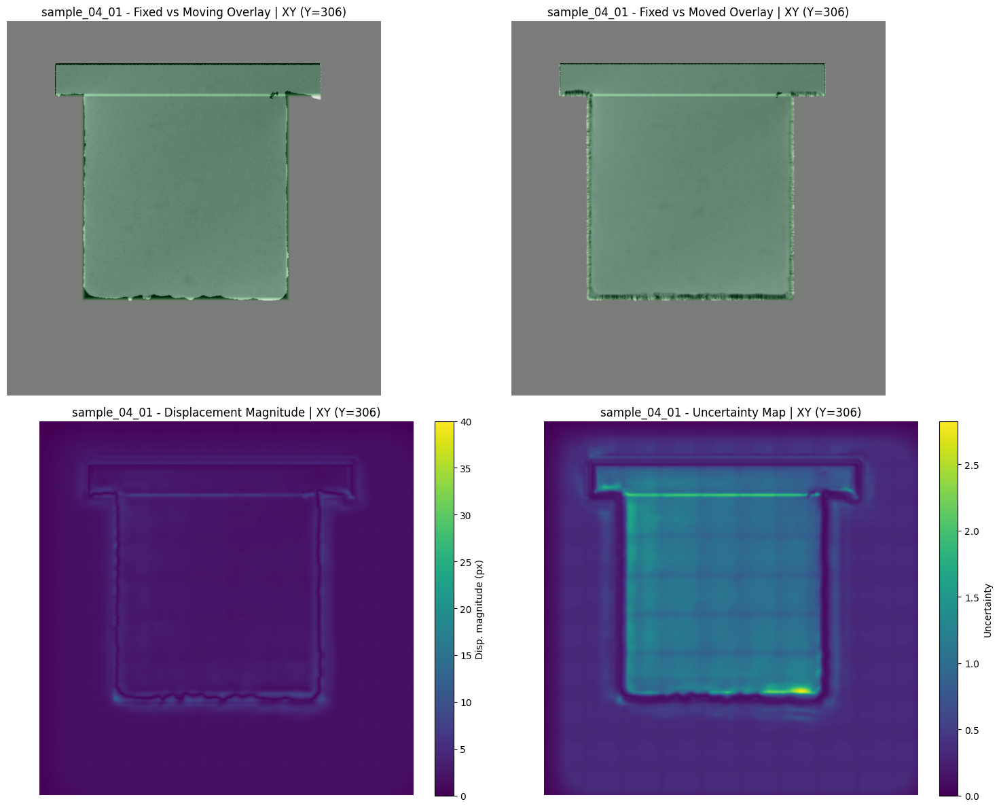


========== Evaluating TEST PAIR 1 ==========
Sample name: sample_04_02
Dice BEFORE reg: 0.9767
--- Running ensemble member 00 ---
Predicting for sample: sample_04_02 (idx=1)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 4.87 minutes
Dice AFTER reg (member 00): 0.9834
--- Running ensemble member 01 ---
Predicting for sample: sample_04_02 (idx=1)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 5.01 minutes
Dice AFTER reg (member 01): 0.9846
--- Running ensemble member 02 ---
Predicting for sample: sample_04_02 (idx=1)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 4.90 minutes
Dice AFTER reg (member 02): 0.9864
--- Running ensemble member 03 ---
Predicting for sample: sample_04_02 (idx=1)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 5.59 minutes
Dice AFTER reg (member 03): 0.9824
--- Running ense

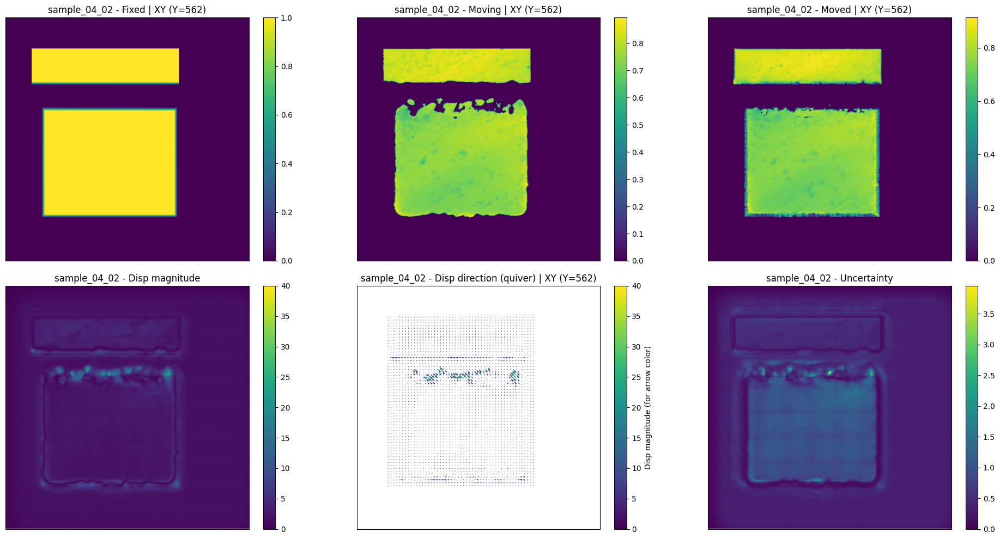

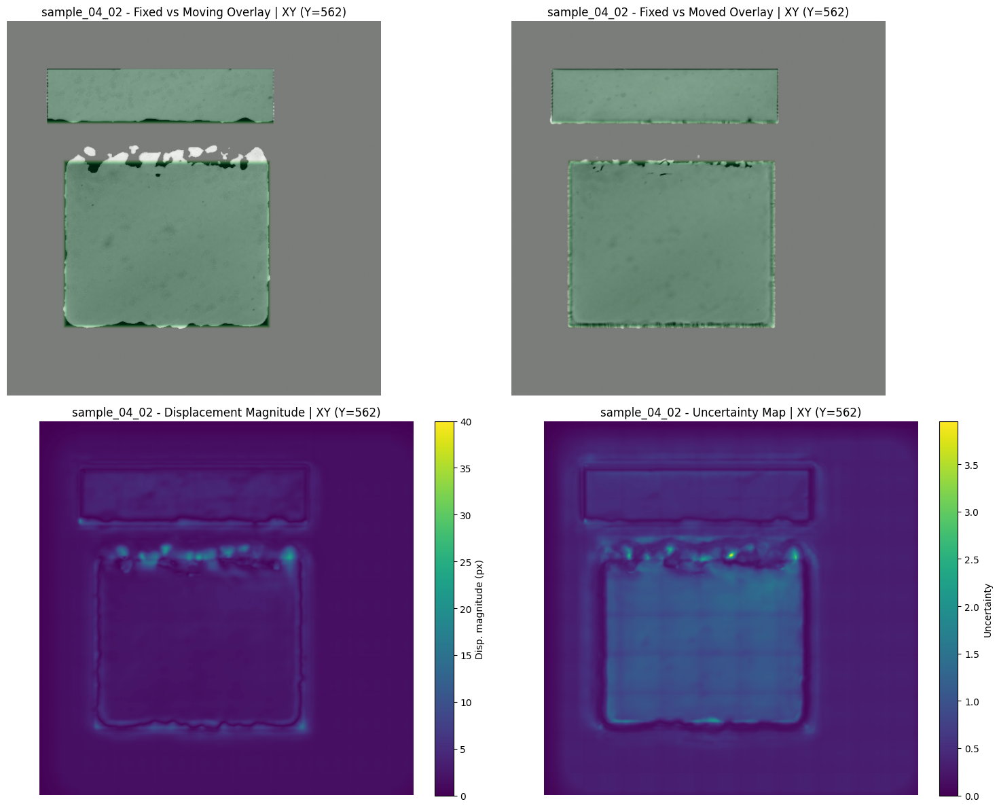


========== Evaluating TEST PAIR 2 ==========
Sample name: sample_04_03
Dice BEFORE reg: 0.9322
--- Running ensemble member 00 ---
Predicting for sample: sample_04_03 (idx=2)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 3.63 minutes
Dice AFTER reg (member 00): 0.9643
--- Running ensemble member 01 ---
Predicting for sample: sample_04_03 (idx=2)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 3.43 minutes
Dice AFTER reg (member 01): 0.9688
--- Running ensemble member 02 ---
Predicting for sample: sample_04_03 (idx=2)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 3.48 minutes
Dice AFTER reg (member 02): 0.9701
--- Running ensemble member 03 ---
Predicting for sample: sample_04_03 (idx=2)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 3.58 minutes
Dice AFTER reg (member 03): 0.9630
--- Running ense

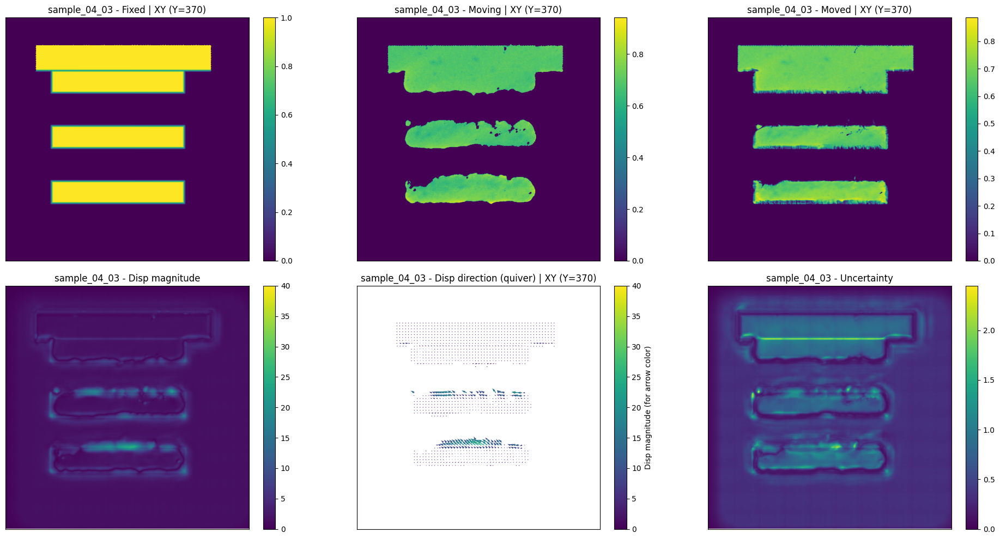

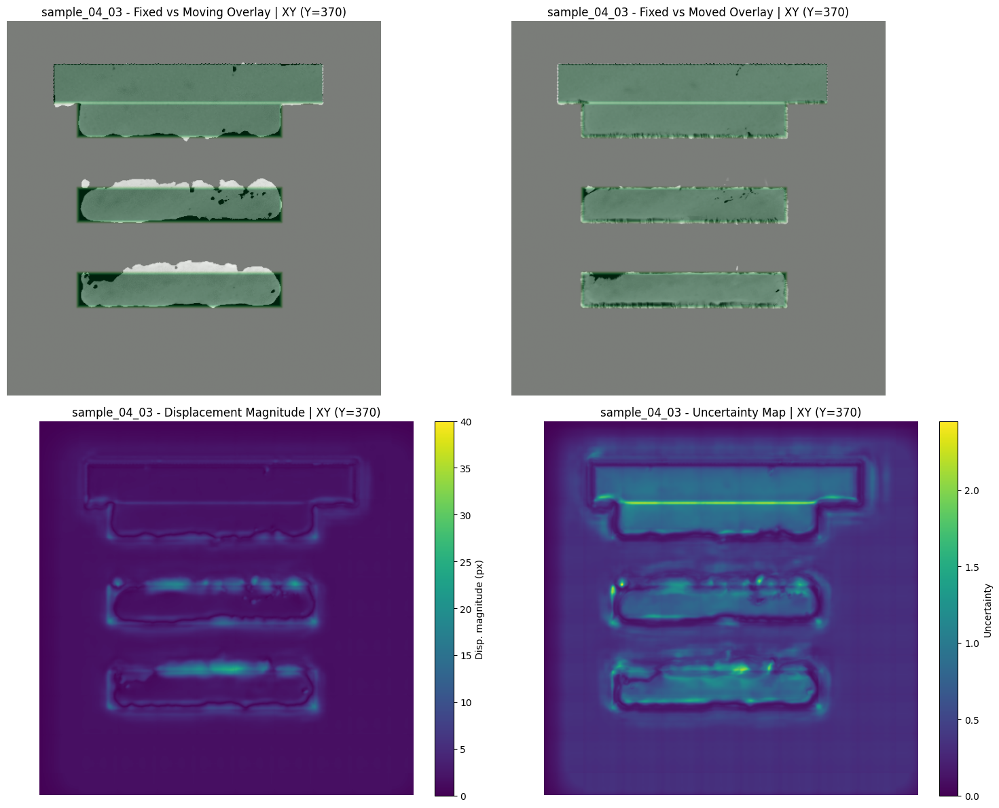


========== Evaluating TEST PAIR 3 ==========
Sample name: sample_04_04
Dice BEFORE reg: 0.9605
--- Running ensemble member 00 ---
Predicting for sample: sample_04_04 (idx=3)
Padded data with zeros
Initialized arrays
Crop padded area :::>
Time taken to test one sample: 3.14 minutes
Dice AFTER reg (member 00): 0.9749
--- Running ensemble member 01 ---
Predicting for sample: sample_04_04 (idx=3)
Padded data with zeros
Initialized arrays


In [ ]:
#!/usr/bin/env python3
import os
import h5py
import numpy as np
import tensorflow as tf
import voxelmorph as vxm
import time

os.environ.setdefault("HDF5_USE_FILE_LOCKING", "FALSE")
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
tf.get_logger().setLevel("ERROR")

from evaluation_utils import (
    save_image_as_vtk,
    save_displacement_vector_as_vtk,
    dice_coefficient,
    save_as_tiff_uint8,
    binarize_volume,
    compute_diff_map,
    report_combined_difference_percentages,
    gaussian_weight
)

# -------------------------
# CONFIG
# -------------------------
ARCH_PATH = "/home/kchand/results/cross_validation/vxm_model_architecture.json"

ENSEMBLE_ROOT = "/home/kchand/results/finetune_two_stage_optuna/ensemble_best_from_optuna"
N_ENSEMBLE = 10

TEST_H5_PATH = "/home/kchand/input_data/test_BTU_samples_simple_structures_pad50_bothends.h5"

PATCH_SIZE = (128, 128, 128)
STRIDE = (64, 64, 64)

OUT_ROOT = "/home/kchand/results/BTU_simple_ensemble_eval"
os.makedirs(OUT_ROOT, exist_ok=True)


# -------------------------
# Helpers: shape normalization
# -------------------------

import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt

def plot_overlay_fixed_moving_moved_mag_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same slicing style as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    cmap_fixed: str = "Greens",
    cmap_other: str = "gray",
    overlay_alpha: float = 0.5,
    mag_vmax: float | None = 40.0,
    unc_vmax: float | None = None,
    title_prefix: str = "",
):
    """
    Plots a 2x2 figure for ONE slice (plane-based), matching your conventions:
      - (0,0): Overlay fixed vs moving
      - (0,1): Overlay fixed vs moved
      - (1,0): Displacement magnitude
      - (1,1): Uncertainty map

    Plane conventions (same as your reference code):
      - YZ: vol[x_mid, :, :]
      - XZ: np.rot90(vol[:, :, z_mid], k=-1)
      - XY: vol[:, y_mid, :]
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have the same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # --- slice extraction (your style) ---
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]
        plane_title = f"YZ (X={si})"

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]
        plane_title = f"XY (Y={si})"

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # --- plotting helpers ---
    def plot_overlay(ax, fixed2d, other2d, title):
        ax.imshow(other2d, cmap=cmap_other)
        ax.imshow(fixed2d, cmap=cmap_fixed, alpha=overlay_alpha)
        ax.set_title(title)
        ax.axis("off")
        ax.set_aspect("equal")

    def imshow_with_cbar(ax, img, title, vmin=None, vmax=None, cmap="viridis", cbar_label=None):
        im = ax.imshow(img, cmap=cmap, vmin=vmin, vmax=vmax, origin="upper")
        ax.set_title(title)
        ax.axis("off")
        ax.set_aspect("equal")
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        if cbar_label:
            cbar.set_label(cbar_label)

    pfx = (title_prefix + " - ") if title_prefix else ""

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    plot_overlay(
        axes[0, 0],
        fixed_sl,
        moving_sl,
        f"{pfx}Fixed vs Moving Overlay | {plane_title}",
    )

    plot_overlay(
        axes[0, 1],
        fixed_sl,
        moved_sl,
        f"{pfx}Fixed vs Moved Overlay | {plane_title}",
    )

    imshow_with_cbar(
        axes[1, 0],
        disp_mag,
        f"{pfx}Displacement Magnitude | {plane_title}",
        vmin=0,
        vmax=mag_vmax,
        cmap="viridis",
        cbar_label="Disp. magnitude (px)",
    )

    imshow_with_cbar(
        axes[1, 1],
        unc_sl,
        f"{pfx}Uncertainty Map | {plane_title}",
        vmin=0,
        vmax=unc_vmax,
        cmap="viridis",
        cbar_label="Uncertainty",
    )

    plt.tight_layout()
    plt.show()
    return fig, axes

def plot_plane_fixed_moving_moved_mag_quiver_unc(
    fixed_image: np.ndarray,
    moving_image: np.ndarray,
    moved_image: np.ndarray,
    disp_field: np.ndarray,
    uncertainty: np.ndarray,
    *,
    plane: str = "XY",                 # "YZ", "XZ", "XY" (same as your script)
    slice_index: int | None = None,    # if None -> middle slice for that plane
    quiver_subsample: int = 6,
    quiver_scale: float = 1.0,         # scale=1 means arrow length = displacement in pixels
    disp_vmax: float | None = 40.0,    # magnitude colormap max (pixels)
    unc_vmax: float | None = None,
    title_prefix: str = "",
    mask_background_with: np.ndarray | None = None,  # e.g., moving_image or fixed_image; mask where ==0
):
    """
    Plane conventions match your reference script:
      - YZ:  vol[x_mid, :, :]                (no rotation)
      - XZ:  rot90(vol[:, :, z_mid], k=-1)   (clockwise)
      - XY:  vol[:, y_mid, :]                (no rotation)

    Quiver direction matches your convention:
      U = dx
      V = -dy   (invert only y-component)
    Quiver colored by displacement magnitude.
    """

    fixed_image = np.asarray(fixed_image)
    moving_image = np.asarray(moving_image)
    moved_image = np.asarray(moved_image)
    disp_field = np.asarray(disp_field)
    uncertainty = np.asarray(uncertainty)

    if fixed_image.ndim != 3 or moving_image.ndim != 3 or moved_image.ndim != 3:
        raise ValueError("fixed/moving/moved must be 3D volumes (D,H,W).")
    if disp_field.ndim != 4 or disp_field.shape[-1] != 3:
        raise ValueError("disp_field must be (D,H,W,3).")
    if uncertainty.ndim != 3:
        raise ValueError("uncertainty must be 3D (D,H,W).")
    if fixed_image.shape != moving_image.shape or fixed_image.shape != moved_image.shape:
        raise ValueError("fixed/moving/moved must have same shape.")
    if fixed_image.shape != uncertainty.shape or fixed_image.shape != disp_field.shape[:3]:
        raise ValueError("uncertainty and disp_field spatial shape must match fixed.")

    Dx, Dy, Dz = fixed_image.shape
    plane = plane.upper()

    # ---- extract slices using YOUR conventions ----
    if plane == "YZ":
        si = Dx // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[si, :, :]
        moving_sl = moving_image[si, :, :]
        moved_sl = moved_image[si, :, :]
        unc_sl = uncertainty[si, :, :]
        disp_sl = disp_field[si, :, :, :]          # (Dy,Dz,3)
        plane_title = f"YZ (X={si})"

    elif plane == "XZ":
        si = Dz // 2 if slice_index is None else slice_index
        fixed_sl = np.rot90(fixed_image[:, :, si], k=-1)
        moving_sl = np.rot90(moving_image[:, :, si], k=-1)
        moved_sl = np.rot90(moved_image[:, :, si], k=-1)
        unc_sl = np.rot90(uncertainty[:, :, si], k=-1)
        disp_sl = np.rot90(disp_field[:, :, si, :], k=-1)    # rotate vectors same way
        plane_title = f"XZ (Z={si}) [rot90 k=-1]"

    elif plane == "XY":
        si = Dy // 2 if slice_index is None else slice_index
        fixed_sl = fixed_image[:, si, :]
        moving_sl = moving_image[:, si, :]
        moved_sl = moved_image[:, si, :]
        unc_sl = uncertainty[:, si, :]
        disp_sl = disp_field[:, si, :, :]          # (Dx,Dz,3)
        plane_title = f"XY (Y={si})"

    else:
        raise ValueError("plane must be one of: 'YZ', 'XZ', 'XY'")

    # ---- magnitude ----
    disp_mag = np.linalg.norm(disp_sl, axis=-1)

    # ---- quiver components (your convention) ----
    U = disp_sl[..., 0]       # dx
    V = -disp_sl[..., 1]      # invert only y-comp (matches your code)

    # ---- optional mask (hide arrows in air/background) ----
    mask = None
    if mask_background_with is not None:
        m = np.asarray(mask_background_with)
        if m.shape != fixed_image.shape:
            raise ValueError("mask_background_with must be same shape as volumes.")
        # build the same slice
        if plane == "YZ":
            mask = (m[si, :, :] != 0)
        elif plane == "XZ":
            mask = np.rot90(m[:, :, si], k=-1) != 0
        else:  # XY
            mask = (m[:, si, :] != 0)

    # ---- plot ----
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    def _imshow(ax, img, title, vmin=None, vmax=None, cmap=None):
        im = ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    pfx = (title_prefix + " - ") if title_prefix else ""

    # Top row
    _imshow(axes[0, 0], fixed_sl,  f"{pfx}Fixed | {plane_title}")
    _imshow(axes[0, 1], moving_sl, f"{pfx}Moving | {plane_title}")
    _imshow(axes[0, 2], moved_sl,  f"{pfx}Moved | {plane_title}")

    # Bottom-left: magnitude heatmap
    _imshow(axes[1, 0], disp_mag, f"{pfx}Disp magnitude", vmin=0, vmax=disp_vmax, cmap="viridis")

    # Bottom-middle: direction via quiver (colored by magnitude)
    axq = axes[1, 1]
    axq.set_title(f"{pfx}Disp direction (quiver) | {plane_title}")
    axq.set_xticks([])
    axq.set_yticks([])
    axq.set_aspect("equal")

    H, W = disp_mag.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))

    ss = max(int(quiver_subsample), 1)
    Xs = X[::ss, ::ss]
    Ys = Y[::ss, ::ss]
    Us = U[::ss, ::ss]
    Vs = V[::ss, ::ss]
    Ms = disp_mag[::ss, ::ss]

    if mask is not None:
        mask_s = mask[::ss, ::ss]
        Us = np.where(mask_s, Us, np.nan)
        Vs = np.where(mask_s, Vs, np.nan)
        Ms = np.where(mask_s, Ms, np.nan)

    quiv = axq.quiver(
        Xs, Ys, Us, Vs, Ms,
        angles="xy",
        scale_units="xy",
        scale=(1.0 / quiver_scale) if quiver_scale != 0 else 1.0,  # keep intuitive control
        cmap="viridis",
        norm=plt.Normalize(vmin=0, vmax=disp_vmax if disp_vmax is not None else np.nanmax(Ms)),
        width=0.003,
    )
    axq.invert_yaxis()  # same as your reference
    cbar = plt.colorbar(quiv, ax=axq, fraction=0.046, pad=0.04)
    cbar.set_label("Disp magnitude (for arrow color)")

    # Bottom-right: uncertainty
    _imshow(axes[1, 2], unc_sl, f"{pfx}Uncertainty", vmin=0, vmax=unc_vmax, cmap="viridis")

    plt.tight_layout()
    plt.show()
    return fig, axes

def test_data_generator_single(
    vxm_model,
    hdf5_file,
    pair_idx: int = 0,
    patch_size=(128, 128, 128),
    stride=(64, 64, 64),
    verbose: bool = True,
):
    """
    Same logic as your original test_data_generator, but:
      - processes ONLY static_{pair_idx}/moving_{pair_idx}
      - yields exactly once
    Keeps:
      - your padding logic
      - your weight normalization (np.maximum(..., 1))
      - your cropping behavior (cropping to vol_shape = static shape)
    """

    hf = h5py.File(hdf5_file, "r")

    def _next_multiple(n, base):
        r = n % base
        return n if r == 0 else n + (base - r)

    start_time = time.time()

    static_key = f"static_{pair_idx}"
    moving_key = f"moving_{pair_idx}"
    if static_key not in hf or moving_key not in hf:
        hf.close()
        raise KeyError(f"Missing {static_key} or {moving_key} in {hdf5_file}")

    sample_name = hf[static_key].attrs.get("sample_name", f"sample_{pair_idx}")
    if verbose:
        print(f"Predicting for sample: {sample_name} (idx={pair_idx})")

    vol_shape = hf[static_key].shape
    moving_image = hf[moving_key][...]
    fixed_image  = hf[static_key][...]

    moving_shape = moving_image.shape
    fixed_shape  = fixed_image.shape

    target_shape = tuple(
        max(_next_multiple(moving_shape[i], patch_size[i]),
            _next_multiple(fixed_shape[i],  patch_size[i]))
        for i in range(3)
    )

    pad_moving = [(0, target_shape[i] - moving_shape[i]) for i in range(3)]
    pad_fixed  = [(0, target_shape[i] - fixed_shape[i])  for i in range(3)]

    padded_moving = np.pad(moving_image, pad_moving, mode="constant", constant_values=0)
    padded_fixed  = np.pad(fixed_image,  pad_fixed,  mode="constant", constant_values=0)
    padded_vol_shape = padded_fixed.shape

    if verbose:
        print("Padded data with zeros")

    patches_per_dim = [
        (padded_vol_shape[i] - patch_size[i]) // stride[i] + 1
        for i in range(len(padded_vol_shape))
    ]

    reconstructed_moved = np.zeros(padded_vol_shape, dtype=np.float32)
    reconstructed_displacement = np.zeros((*padded_vol_shape, 3), dtype=np.float32)
    weight_volume = np.zeros(padded_vol_shape, dtype=np.float32)

    gaussian_weights = gaussian_weight(patch_size).astype(np.float32)

    if verbose:
        print("Initialized arrays")

    for z in range(patches_per_dim[0]):
        for y in range(patches_per_dim[1]):
            for x in range(patches_per_dim[2]):
                start_z = z * stride[0]
                start_y = y * stride[1]
                start_x = x * stride[2]

                moving_patch = padded_moving[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                fixed_patch = padded_fixed[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ]

                patch_input = np.expand_dims(moving_patch, axis=-1)
                fixed_patch = np.expand_dims(fixed_patch, axis=-1)

                inputs = [
                    np.expand_dims(patch_input, axis=0),
                    np.expand_dims(fixed_patch, axis=0),
                ]

                processed_patch, displacement_patch = vxm_model.predict(inputs, verbose=0)
                processed_patch = processed_patch.squeeze().astype(np.float32)
                displacement_patch = displacement_patch.squeeze().astype(np.float32)

                reconstructed_moved[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += processed_patch * gaussian_weights

                reconstructed_displacement[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                    :
                ] += displacement_patch * gaussian_weights[..., np.newaxis]

                weight_volume[
                    start_z:start_z + patch_size[0],
                    start_y:start_y + patch_size[1],
                    start_x:start_x + patch_size[2],
                ] += gaussian_weights

    # Your original normalization
    reconstructed_moved /= np.maximum(weight_volume, 1)
    reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)

    if verbose:
        print("Crop padded area :::>")

    reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
    reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]

    hf.close()

    elapsed_time = (time.time() - start_time) / 60
    if verbose:
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")

    yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image


def _to_scalar_volume(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x)
    if x.ndim == 5 and x.shape[0] == 1:
        x = x[0]
    if x.ndim == 4 and x.shape[-1] == 1:
        x = x[..., 0]
    if x.ndim != 3:
        raise ValueError(f"Expected scalar volume -> (D,H,W), got {x.shape}")
    return x.astype(np.float32, copy=False)


def _to_disp_volume(u: np.ndarray) -> np.ndarray:
    u = np.asarray(u)
    if u.ndim == 5 and u.shape[0] == 1:
        u = u[0]
    if u.ndim != 4 or u.shape[-1] != 3:
        raise ValueError(f"Expected disp volume -> (D,H,W,3), got {u.shape}")
    return u.astype(np.float32, copy=False)


# -------------------------
# Model loader
# -------------------------
def build_model_from_json(json_path: str):
    with open(json_path, "r") as f:
        model_json = f.read()
    model = tf.keras.models.model_from_json(
        model_json,
        custom_objects={
            "SpatialTransformer": vxm.layers.SpatialTransformer,
            "VxmDense": vxm.networks.VxmDense,
        },
    )
    return model


def load_ensemble_models(n_members: int):
    models = []
    for i in range(n_members):
        weights_path = os.path.join(ENSEMBLE_ROOT, f"ens_{i:02d}", "weights_stage2.h5")
        if not os.path.exists(weights_path):
            raise FileNotFoundError(f"Missing ensemble weights: {weights_path}")

        m = build_model_from_json(ARCH_PATH)
        m.load_weights(weights_path)
        models.append(m)
        print(f"Loaded ensemble member {i:02d}: {weights_path}")
    return models


# -------------------------
# Ensemble aggregation
# -------------------------
def aggregate_ensemble(moved_list, disp_list, ddof: int = 1):
    moved_stack = np.stack(moved_list, axis=0)   # (N,D,H,W)
    moved_mean = moved_stack.mean(axis=0)
    moved_std  = moved_stack.std(axis=0, ddof=ddof)

    disp_stack = np.stack(disp_list, axis=0)     # (N,D,H,W,3)
    disp_mean = disp_stack.mean(axis=0)
    disp_std_xyz = disp_stack.std(axis=0, ddof=ddof)

    # A) std of displacement magnitude across ensemble
    disp_mag = np.linalg.norm(disp_stack, axis=-1)          # (N,D,H,W)
    disp_std_mag_A = disp_mag.std(axis=0, ddof=ddof)        # (D,H,W)

    # B) magnitude of component-wise std
    disp_std_mag_B = np.linalg.norm(disp_std_xyz, axis=-1)  # (D,H,W)

    return moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B


# -------------------------
# Determine number of test pairs in the H5
# -------------------------
def get_num_pairs(h5_path: str) -> int:
    with h5py.File(h5_path, "r") as hf:
        statics = sorted([k for k in hf.keys() if k.startswith("static_")])
        movings = sorted([k for k in hf.keys() if k.startswith("moving_")])
    n = min(len(statics), len(movings))
    if n == 0:
        raise RuntimeError(f"No static_/moving_ datasets found in {h5_path}")
    return n


# -------------------------
# MAIN
# -------------------------
if __name__ == "__main__":

    if not os.path.exists(TEST_H5_PATH):
        raise FileNotFoundError(f"Test H5 not found: {TEST_H5_PATH}")

    # reproducibility (inference should be deterministic anyway)
    tf.random.set_seed(0)
    np.random.seed(0)

    n_pairs = get_num_pairs(TEST_H5_PATH)
    print(f"Found {n_pairs} test pair(s) in: {TEST_H5_PATH}")

    models = load_ensemble_models(N_ENSEMBLE)

    for pair_idx in range(n_pairs):
        print(f"\n========== Evaluating TEST PAIR {pair_idx} ==========")

        # Read baseline fixed/moving directly for Dice-before
        with h5py.File(TEST_H5_PATH, "r") as hf:
            fixed_full  = _to_scalar_volume(hf[f"static_{pair_idx}"][...])
            moving_full = _to_scalar_volume(hf[f"moving_{pair_idx}"][...])
            sample_name = hf[f"static_{pair_idx}"].attrs.get("sample_name", f"test_{pair_idx:02d}")

        OUT_DIR = os.path.join(OUT_ROOT, f"{sample_name}_idx_{pair_idx:02d}")
        os.makedirs(OUT_DIR, exist_ok=True)

        Dice_init = dice_coefficient(fixed_full, moving_full)
        print(f"Sample name: {sample_name}")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")

        moved_list = []
        disp_list = []
        dice_after_list = []

        fixed_image = None
        moving_image = None

        for mi, model in enumerate(models):
            print(f"--- Running ensemble member {mi:02d} ---")

            # IMPORTANT: your generator must know which pair to use.
            # If your test_data_generator currently always returns *_0,
            # update it to accept pair_idx and read static_{pair_idx}/moving_{pair_idx}.
            gen = test_data_generator_single(
                model,
                TEST_H5_PATH,
                patch_size=PATCH_SIZE,
                stride=STRIDE,
                pair_idx=pair_idx,  # <-- add this to your generator signature
            )

            reconstructed_moved, reconstructed_disp, fixed_img, moving_img = next(gen)

            moved = _to_scalar_volume(reconstructed_moved)
            disp  = _to_disp_volume(reconstructed_disp)

            fixed_image  = _to_scalar_volume(fixed_img)
            moving_image = _to_scalar_volume(moving_img)

            moved_list.append(moved)
            disp_list.append(disp)

            d = dice_coefficient(fixed_image, moved)
            dice_after_list.append(d)
            print(f"Dice AFTER reg (member {mi:02d}): {d:.4f}")

        dice_after_arr = np.asarray(dice_after_list, dtype=np.float32)
        print("\n===== ENSEMBLE DICE SUMMARY =====")
        print(f"Dice BEFORE reg: {Dice_init:.4f}")
        print(f"Dice AFTER reg: mean={dice_after_arr.mean():.4f} std={dice_after_arr.std(ddof=1):.4f}")

        moved_mean, moved_std, disp_mean, disp_std_xyz, disp_std_mag_A, disp_std_mag_B = aggregate_ensemble(
            moved_list, disp_list, ddof=1
        )

        Dice_after_mean = dice_coefficient(fixed_image, moved_mean)
        print(f"Dice AFTER reg (ensemble mean moved): {Dice_after_mean:.4f}")

        # Optional: binarize + diff stats
        binary_fixed      = binarize_volume(fixed_image)
        binary_moving     = binarize_volume(moving_image)
        binary_moved_mean = binarize_volume(moved_mean)

        diff_map_before = compute_diff_map(binary_fixed, binary_moving)
        _ = report_combined_difference_percentages(diff_map_before, binary_fixed, binary_moving)

        diff_map_after = compute_diff_map(binary_fixed, binary_moved_mean)
        _ = report_combined_difference_percentages(diff_map_after, binary_fixed, binary_moved_mean)

        plot_plane_fixed_moving_moved_mag_quiver_unc(
            fixed_image=fixed_image,
            moving_image=moving_image,
            moved_image=moved_mean,
            disp_field=disp_mean,
            uncertainty=disp_std_mag_B,      # or moved_std
            plane="XY",                      # "YZ" / "XZ" / "XY"
            slice_index=None,
            quiver_subsample=8,
            quiver_scale=1.0,
            disp_vmax=40,
            unc_vmax=None,
            mask_background_with=moving_image,  # hides arrows in air (optional but useful)
            title_prefix=sample_name
            )

        plot_overlay_fixed_moving_moved_mag_unc(
            fixed_image=fixed_image,
            moving_image=moving_image,
            moved_image=moved_mean,
            disp_field=disp_mean,
            uncertainty=disp_std_mag_B,   # or moved_std
            plane="XY",
            slice_index=None,
            mag_vmax=40,
            unc_vmax=None,
            title_prefix=sample_name
        )

